# AAL3 for ADNI patients

All the imports and installs we'll need.


In [1]:
import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

#import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [2]:

# AAL3

import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting, input_data
import nibabel as nib

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (e.g., CSV or TXT)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the labels
with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]
    roi_labels = [line.strip() for line in f]
    print("roi name :", roi_names)
    #print("roi label :", roi_labels)


# Create a masker using NiftiLabelsMasker

# Just for demonstration, let's plot the atlas regions
#atlas_img = nib.load(aal3_atlas_filename)

# Plot the AAL3 atlas
#plotting.plot_roi(atlas_img, title='AAL3 Atlas')

#plt.show()


roi name : ['1 Precentral_L 1', '2 Precentral_R 2', '3 Frontal_Sup_2_L 3', '4 Frontal_Sup_2_R 4', '5 Frontal_Mid_2_L 5', '6 Frontal_Mid_2_R 6', '7 Frontal_Inf_Oper_L 7', '8 Frontal_Inf_Oper_R 8', '9 Frontal_Inf_Tri_L 9', '10 Frontal_Inf_Tri_R 10', '11 Frontal_Inf_Orb_2_L 11', '12 Frontal_Inf_Orb_2_R 12', '13 Rolandic_Oper_L 13', '14 Rolandic_Oper_R 14', '15 Supp_Motor_Area_L 15', '16 Supp_Motor_Area_R 16', '17 Olfactory_L 17', '18 Olfactory_R 18', '19 Frontal_Sup_Medial_L 19', '20 Frontal_Sup_Medial_R 20', '21 Frontal_Med_Orb_L 21', '22 Frontal_Med_Orb_R 22', '23 Rectus_L 23', '24 Rectus_R 24', '25 OFCmed_L 25', '26 OFCmed_R 26', '27 OFCant_L 27', '28 OFCant_R 28', '29 OFCpost_L 29', '30 OFCpost_R 30', '31 OFClat_L 31', '32 OFClat_R 32', '33 Insula_L 33', '34 Insula_R 34', '35 Cingulate_Ant_L', '36 Cingulate_Ant_R', '37 Cingulate_Mid_L 37', '38 Cingulate_Mid_R 38', '39 Cingulate_Post_L 39', '40 Cingulate_Post_R 40', '41 Hippocampus_L 41', '42 Hippocampus_R 42', '43 ParaHippocampal_L 43

In [3]:
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import matplotlib.pyplot as plt
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

In [5]:

import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting, input_data
import nibabel as nib


# Define the directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2013-02-11_14_39_50.0/I358811/"

# Define the output folder for NIfTI files
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.0523289350919475132'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.05312028905822313000'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01810897284456849148'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom

In [4]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"


# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)


# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]



/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {121, 170, 133}. Label image only contains 164 labels (including background).
  warnings.warn(


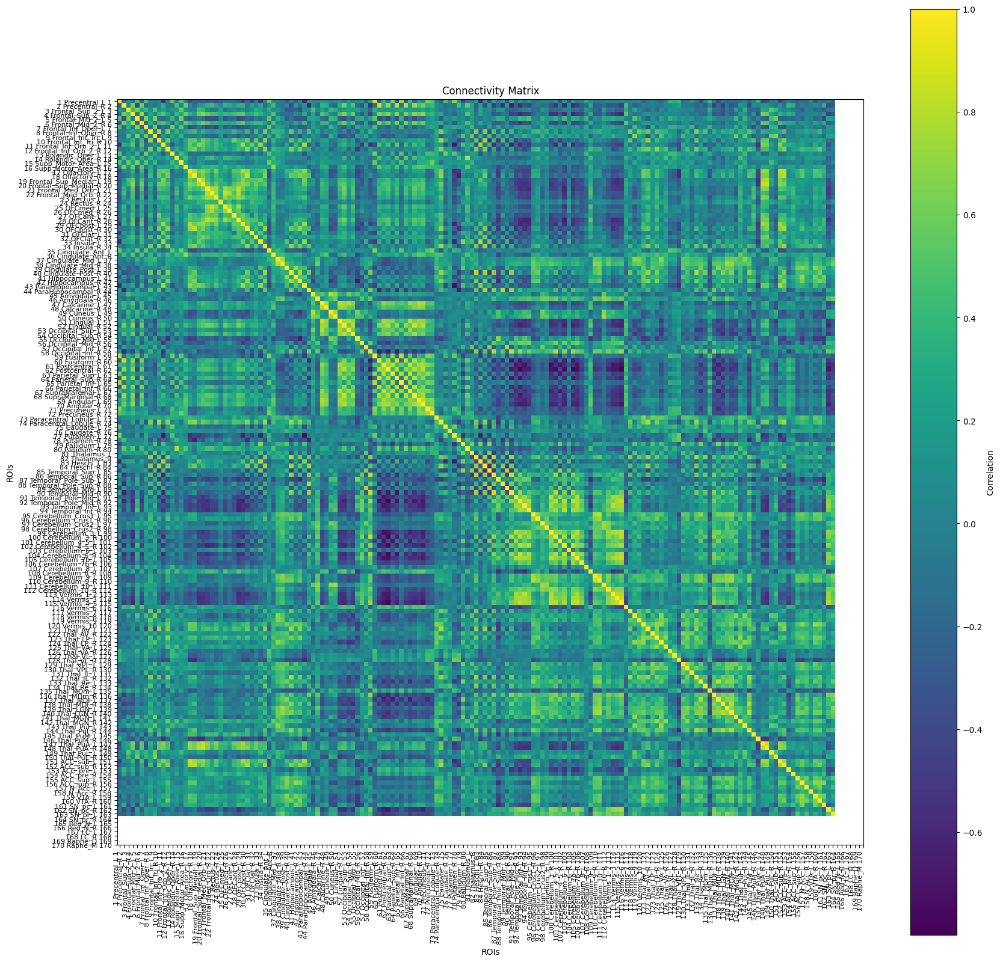

In [5]:

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))


plt.imshow(connectivity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [6]:
female_BL = connectivity_matrix

%store female_BL

np.savez('female_BL.npz', data = female_BL)


Stored 'female_BL' (ndarray)


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {121, 170, 133}. Label image only contains 164 labels (including background).
  warnings.warn(


Filtered Connectivity Matrix:
 [[ 1.         -0.23155825  0.13042909 ... -0.32865357 -0.09502918
  -0.2055836 ]
 [-0.23155825  1.          0.01287384 ...  0.1101017  -0.08796066
   0.34723848]
 [ 0.13042909  0.01287384  1.         ... -0.20587458 -0.15096053
  -0.3346626 ]
 ...
 [-0.32865357  0.1101017  -0.20587458 ...  1.          0.65746
   0.61829734]
 [-0.09502918 -0.08796066 -0.15096053 ...  0.65746     1.
   0.40653053]
 [-0.2055836   0.34723848 -0.3346626  ...  0.61829734  0.40653053
   1.        ]]


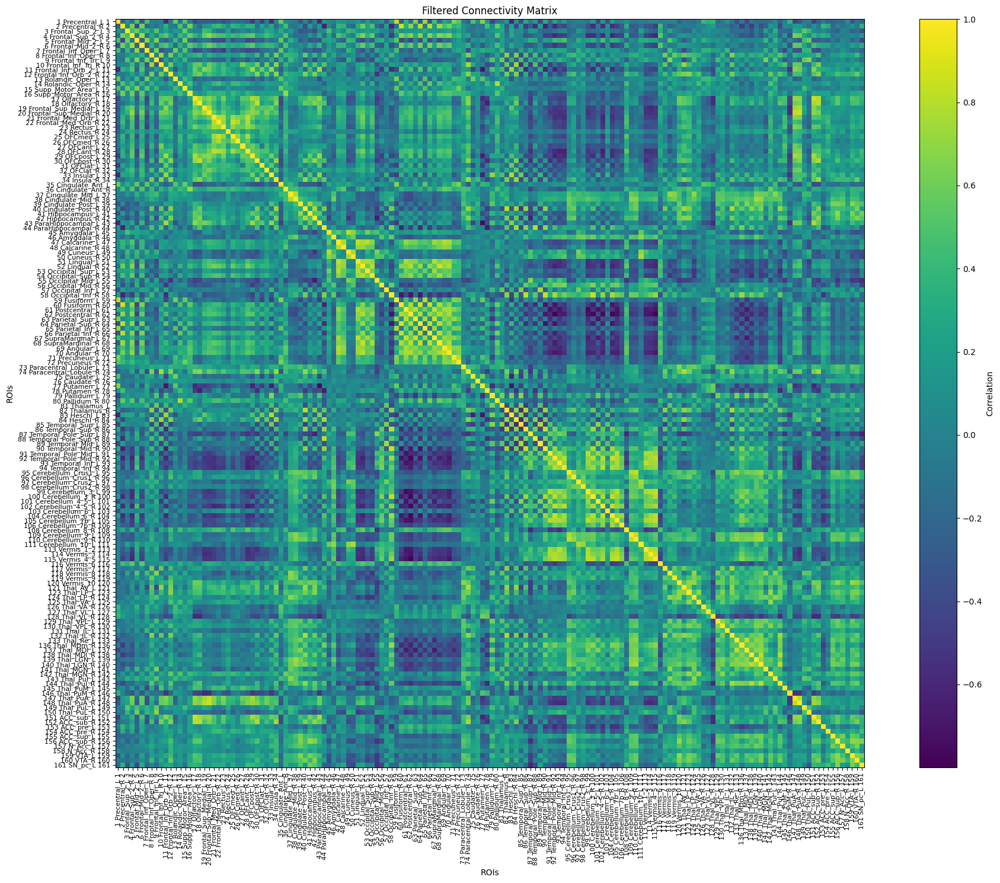

In [7]:
from nilearn import datasets, input_data, connectome
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"


# List of ROIs to filter out
rois_to_filter_out = [106, 111, 121, 133, 134, 164, 167, 168, 170, 161, 162] # empirically adding 161, 162

# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Print the filtered connectivity matrix
print("Filtered Connectivity Matrix:\n", connectivity_matrix)

# Visualize the filtered connectivity matrix
plt.figure(figsize=(20, 15))
plt.imshow(connectivity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Filtered Connectivity Matrix')
plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)
plt.tight_layout()
plt.show()

# Save the filtered connectivity matrix to a file
np.save('filtered_connectivity_matrix.npy', connectivity_matrix)


In [10]:
female_BL = connectivity_matrix

%store female_BL

np.savez('female_BL.npz', data = female_BL)


Stored 'female_BL' (ndarray)


In [11]:
female_BL.size

24336

In [7]:
# May 27


#from nilearn import datasets, input_data, connectome
#import numpy as np
#import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"

#masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

#time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
#non_empty_rois = np.any(time_series, axis=0)
#non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
#filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
#correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
#connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Print the filtered connectivity matrix
#print("Filtered Connectivity Matrix:\n", connectivity_matrix)

# Visualize the filtered connectivity matrix
#plt.figure(figsize=(20, 15))
#plt.imshow(connectivity_matrix, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.xticks(ticks=np.arange(len(non_empty_indices)), labels=[roi_names[i] for i in non_empty_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(non_empty_indices)), labels=[roi_names[i] for i in non_empty_indices], fontsize=8)
##plt.tight_layout()
#plt.show()

# Save the filtered connectivity matrix to a file
#np.save('filtered_connectivity_matrix.npy', connectivity_matrix)


In [7]:
dicom_folder = "/Users/mariamannone/Downloads/ADNI 3/019_S_5019/Resting_State_fMRI/2012-11-07_13_45_02.0/I345555"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]


# Convert DICOM to NIfTI
nifti_file_fu = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file_fu, compression=True, reorient=True)



NameError: name 'pydicom' is not defined

In [12]:

# Define the path to the NIfTI file
nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/601_resting_state_fmri.nii.gz"

#fmri_img_fu = nib.load(nifti_file_fu)



# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')
time_series_fu = masker.fit_transform(nifti_file_fu)

# Compute the connectivity matrix (correlation)
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices_fu = correlation_measure_fu.fit_transform([time_series_fu])

# Extract the connectivity matrix
connectivity_matrix_fu = correlation_matrices_fu[0]



/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170}. Label image only contains 162 labels (including background).
  warnings.warn(


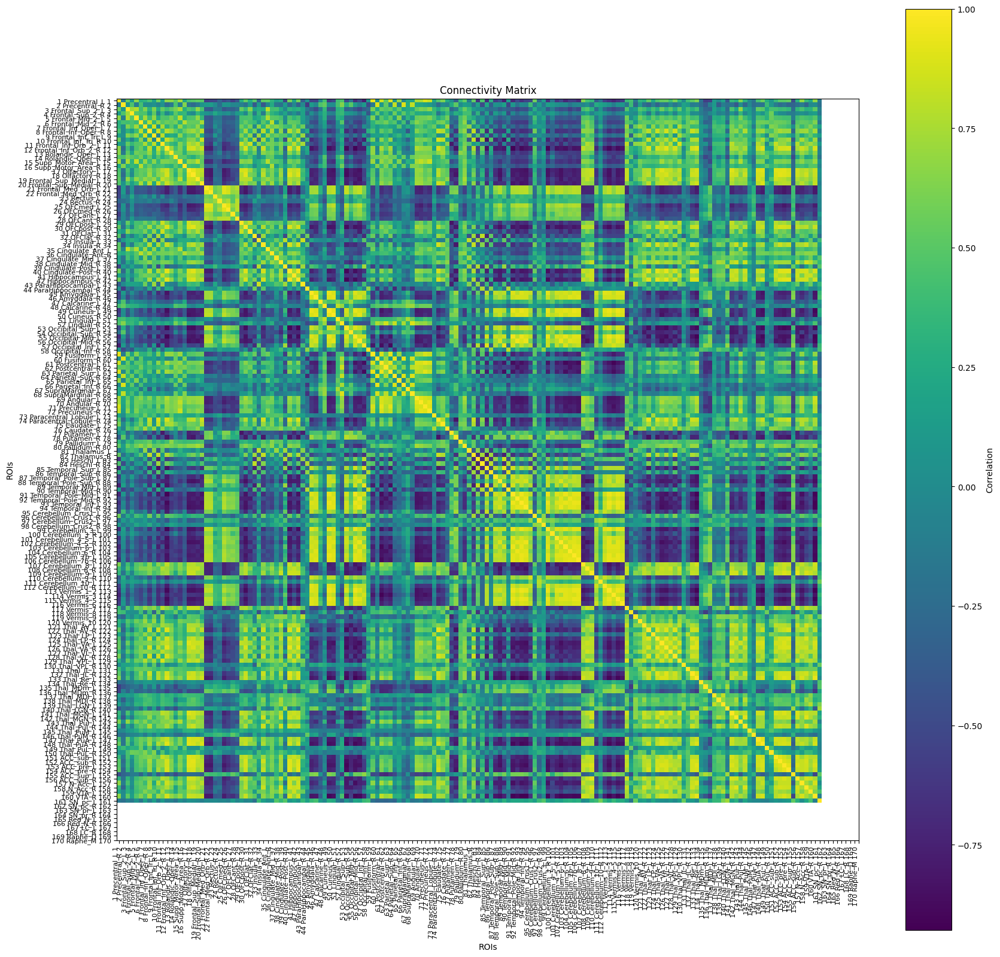

In [13]:
# Plot the connectivity matrix

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))


plt.imshow(connectivity_matrix_fu, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [14]:
import pickle

female_FU = connectivity_matrix_fu

%store female_FU

np.savez('female_FU.npz', data = female_FU)

Stored 'female_FU' (ndarray)


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170}. Label image only contains 162 labels (including background).
  warnings.warn(


Filtered Connectivity Matrix:
 [[ 1.         -0.13995942  0.5531019  ...  0.21234314  0.6614805
  -0.15270832]
 [-0.13995942  1.          0.07860027 ... -0.02326384  0.00410295
  -0.20787434]
 [ 0.5531019   0.07860027  1.         ...  0.30938292  0.5118428
  -0.07777254]
 ...
 [ 0.21234314 -0.02326384  0.30938292 ...  1.          0.6359771
   0.44601864]
 [ 0.6614805   0.00410295  0.5118428  ...  0.6359771   1.
  -0.10537528]
 [-0.15270832 -0.20787434 -0.07777254 ...  0.44601864 -0.10537528
   1.        ]]


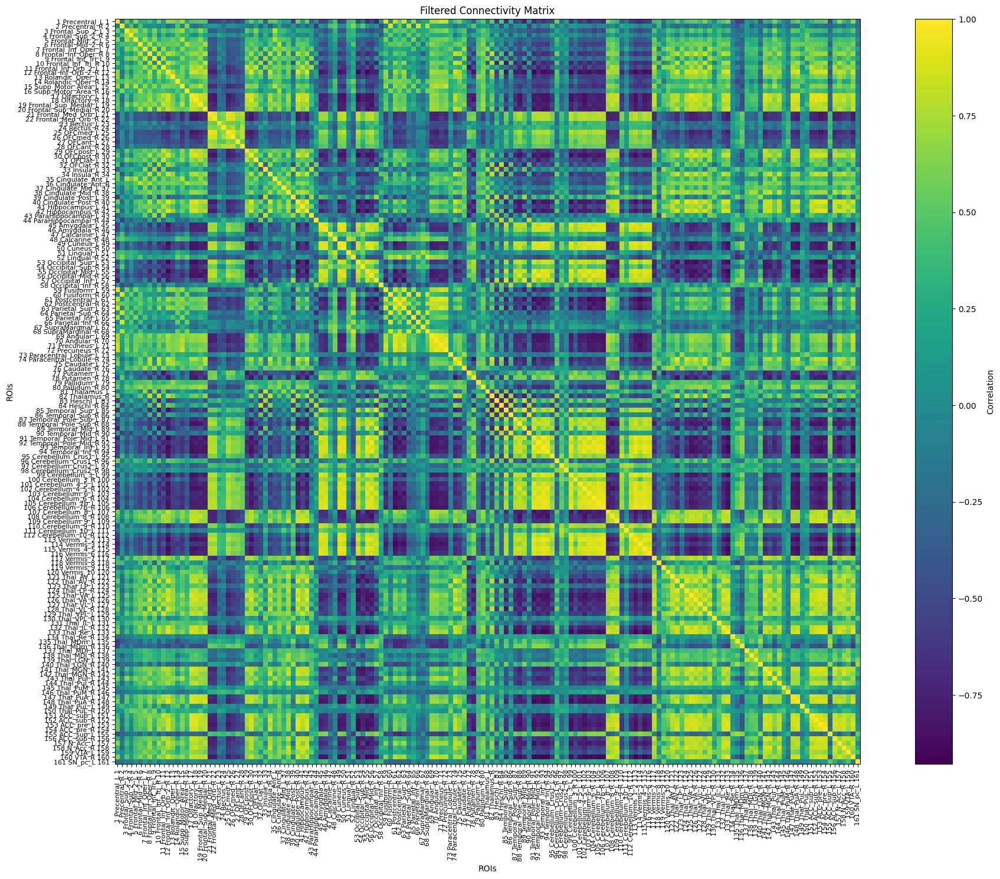

In [15]:
# May 27


from nilearn import datasets, input_data, connectome
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the NIfTI file
# nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"

nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/601_resting_state_fmri.nii.gz"


masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series_FU = masker.fit_transform(nifti_file_fu)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series_FU, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series_FU = time_series_FU[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure_FU = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix_FU = correlation_measure_FU.fit_transform([filtered_time_series_FU])[0]

# Print the filtered connectivity matrix
print("Filtered Connectivity Matrix:\n", connectivity_matrix_FU)

# Visualize the filtered connectivity matrix
plt.figure(figsize=(20, 15))
plt.imshow(connectivity_matrix_FU, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Filtered Connectivity Matrix')
plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.xticks(ticks=np.arange(len(non_empty_indices)), labels=[roi_names[i] for i in non_empty_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(non_empty_indices)), labels=[roi_names[i] for i in non_empty_indices], fontsize=8)
plt.tight_layout()
plt.show()

# Save the filtered connectivity matrix to a file
np.save('filtered_connectivity_matrix_FU.npy', connectivity_matrix_FU)


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170}. Label image only contains 162 labels (including background).
  warnings.warn(


Filtered Connectivity Matrix:
 [[ 1.         -0.23155825  0.13042909 ... -0.32865357 -0.09502918
  -0.2055836 ]
 [-0.23155825  1.          0.01287384 ...  0.1101017  -0.08796066
   0.34723848]
 [ 0.13042909  0.01287384  1.         ... -0.20587458 -0.15096053
  -0.3346626 ]
 ...
 [-0.32865357  0.1101017  -0.20587458 ...  1.          0.65746
   0.61829734]
 [-0.09502918 -0.08796066 -0.15096053 ...  0.65746     1.
   0.40653053]
 [-0.2055836   0.34723848 -0.3346626  ...  0.61829734  0.40653053
   1.        ]]


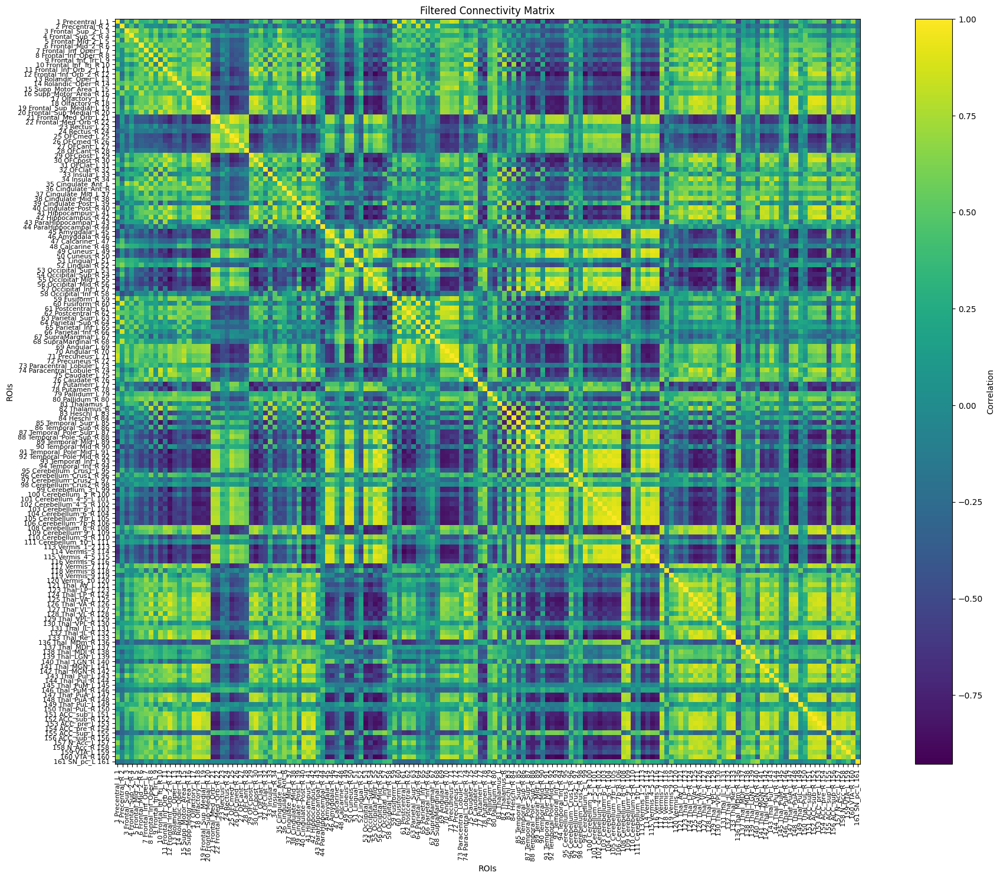

In [16]:
from nilearn import datasets, input_data, connectome
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the NIfTI file
nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/601_resting_state_fmri.nii.gz"


# List of ROIs to filter out
rois_to_filter_out = [106, 111, 121, 133, 134, 164, 167, 168, 170, 161, 162]

# Create a masker using NiftiLabelsMasker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
time_series_fu = masker.fit_transform(nifti_file_fu)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series_fu, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series_fu = time_series_fu[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix_fu = correlation_measure_fu.fit_transform([filtered_time_series_fu])[0]

# Print the filtered connectivity matrix
print("Filtered Connectivity Matrix:\n", connectivity_matrix)

# Visualize the filtered connectivity matrix
plt.figure(figsize=(20, 15))
plt.imshow(connectivity_matrix_fu, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Filtered Connectivity Matrix')
plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)
plt.tight_layout()
plt.show()

# Save the filtered connectivity matrix to a file
np.save('filtered_connectivity_matrix.npy', connectivity_matrix_fu)


In [17]:
import pickle

female_FU = connectivity_matrix_fu

%store female_FU

np.savez('female_FU.npz', data = female_FU)

Stored 'female_FU' (ndarray)


In [18]:
female_FU.size

24336

In [76]:
size1 = female_BL.size
size2 = female_FU.size
print(size1, size2)

24336 24336


In [77]:
print("Time series length for first dataset:", len(time_series))
print("Time series length for second dataset:", len(time_series_fu))

Time series length for first dataset: 140
Time series length for second dataset: 140


In [78]:
print("Number of ROIs for first dataset:", time_series.shape[1])
print("Number of ROIs for second dataset:", time_series_fu.shape[1])

Number of ROIs for first dataset: 163
Number of ROIs for second dataset: 161


In [17]:
from nilearn import datasets
import numpy as np


# Assume 'time_series' is your data from the first dataset
# and 'time_series_fu' is your data from the second dataset
# (you might need to adjust the names according to your actual data)

# Extract the ROI indices from the time series data
roi_indices_first = list(range(time_series.shape[1]))
roi_indices_second = list(range(time_series_fu.shape[1]))

# Find the missing ROIs in the first dataset
missing_in_first = set(roi_indices_second) - set(roi_indices_first)

# Print the ROI lists for each dataset
print("ROI indices in the first dataset:", roi_indices_first)
print("ROI indices in the second dataset:", roi_indices_second)

# Print the missing ROI indices and corresponding names
print("Missing ROI indices in the first dataset:", sorted(list(missing_in_first)))

missing_roi_labels = [roi_labels[i] for i in sorted(missing_in_first)]
print("Missing ROI labels in the first dataset:", missing_roi_labels)


ROI indices in the first dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162]
ROI indices in the second dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58

In [18]:
# Remove these missing ROIs from the second dataset, and perform the computation of K

In [19]:
#from nilearn import datasets, connectome, input_data
#import numpy as np

# Define the path to the NIfTI file
#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/801_resting_state_fmri.nii.gz"

# Load the AAL atlas
#aal_atlas = datasets.fetch_atlas_aal()
#roi_labels = aal_atlas.labels  # All ROI names

# List of ROIs to remove
#rois_to_remove = ['Vermis_9', 'Vermis_10']

# Get the indices of the ROIs to remove
#rois_to_remove_indices = [i for i, label in enumerate(roi_labels) if label in rois_to_remove]

# Create a mask to retain only the ROIs not in 'rois_to_remove_indices'
#keep_mask = [i for i in range(len(roi_labels)) if i not in rois_to_remove_indices]

# Apply the "keep mask" to filter the connectivity matrix
# Keep only the rows and columns that are in 'keep_mask'
#connectivity_matrix_filtered = connectivity_matrix_fu[keep_mask, :][:, keep_mask]

#print("Filtered Connectivity Matrix:", connectivity_matrix_filtered)

# Visualize the filtered connectivity matrix
#import matplotlib.pyplot as plt
#plt.imshow(connectivity_matrix_filtered, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


In [82]:
#from nilearn import datasets, input_data, connectome
#import numpy as np
#import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"


# List of ROIs to keep (first 161)
#rois_to_keep_indices = list(range(160))

# Create a masker using NiftiLabelsMasker
#masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
#time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix
#correlation_measure_BL = connectome.ConnectivityMeasure(kind='correlation')
#connectivity_matrix_BL = correlation_measure_BL.fit_transform([time_series])[0]

# Apply the "keep mask" to filter the connectivity matrix
#connectivity_matrix_filtered_BL = connectivity_matrix_BL[rois_to_keep_indices, :][:, rois_to_keep_indices]

# Print the filtered connectivity matrix
#print("Filtered Connectivity Matrix:\n", connectivity_matrix_filtered_BL)

# Visualize the filtered connectivity matrix
#plt.figure(figsize=(10, 8))
#plt.imshow(connectivity_matrix_filtered_BL, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.xticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], fontsize=8)
#plt.tight_layout()
#plt.show()

# Save the filtered connectivity matrix to a file
#np.save('filtered_connectivity_matrix.npy', connectivity_matrix_filtered_BL)


In [31]:
#connectivity_matrix_filtered_BL.size

In [32]:
#from nilearn import datasets, input_data, connectome
#import numpy as np
#import matplotlib.pyplot as plt

# Define the path to the NIfTI file
#nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/601_resting_state_fmri.nii.gz"

# List of ROIs to keep (first 161)
#rois_to_keep_indices = list(range(160))

# Create a masker using NiftiLabelsMasker
#masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

# Extract time series from the fMRI image using the atlas
#time_series_fu = masker.fit_transform(nifti_file_fu)

# Compute the connectivity matrix
#correlation_measure_FU = connectome.ConnectivityMeasure(kind='correlation')
#connectivity_matrix_FU = correlation_measure_FU.fit_transform([time_series_fu])[0]

# Apply the "keep mask" to filter the connectivity matrix
#connectivity_matrix_filtered_FU = connectivity_matrix_FU[rois_to_keep_indices, :][:, rois_to_keep_indices]

# Print the filtered connectivity matrix
#print("Filtered Connectivity Matrix:\n", connectivity_matrix_filtered_FU)

# Visualize the filtered connectivity matrix
#plt.figure(figsize=(10, 8))
#plt.imshow(connectivity_matrix_filtered_FU, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Filtered Connectivity Matrix')
#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.xticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(rois_to_keep_indices)), labels=[roi_names[i] for i in rois_to_keep_indices], fontsize=8)
#plt.tight_layout()
#plt.show()

# Save the filtered connectivity matrix to a file
#np.save('filtered_connectivity_matrix_FU.npy', connectivity_matrix_filtered_FU)


In [20]:
#size1 = connectivity_matrix_filtered_BL.size
#size2 = connectivity_matrix_filtered_FU.size
#print(size1, size2)


size1 = female_BL.size
size2 = female_FU.size
print(size1, size2)

24336 24336


In [21]:
#female_BL = connectivity_matrix_filtered_BL

%store female_BL

np.savez('female_BL.npz', data = female_BL)

#female_FU = connectivity_matrix_filtered_FU

%store female_FU

np.savez('female_FU.npz', data = female_FU)

Stored 'female_BL' (ndarray)
Stored 'female_FU' (ndarray)


In [35]:
# May 23, new test for K

In [52]:
# Example matrices

# Invert the elements of matrix2, handle zeros to avoid division by zero
with np.errstate(divide='ignore', invalid='ignore'):
    inverse_local_connectivity_matrix_filtered_BL = np.where(connectivity_matrix_filtered_BL != 0, 1 / connectivity_matrix_filtered_BL, 0)  # set inverse of 0 elements to 0

# Multiply element-wise
K_new = connectivity_matrix_filtered_FU * inverse_local_connectivity_matrix_filtered_BL

# Adjust the figure size to fit all labels
#plt.figure(figsize=(20, 20))

#plt.imshow(K_new, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Connectivity Matrix')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


# Set the threshold
threshold = 50

# Create a boolean mask for the condition
mask = np.abs(K_new) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix_new = np.where(mask, K_new, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

vmin, vmax = -1, 1
plt.imshow(filtered_matrix_new, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K (019_S_5019)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_AAL3_filtered_ADNI_019_S_5019_2.png', dpi=300)
plt.show()


NameError: name 'connectivity_matrix_filtered_BL' is not defined

In [37]:
# Further test for K


# Multiply element-wise
K_new2 = connectivity_matrix_filtered_FU @ (np.linalg.inv(connectivity_matrix_filtered_BL))

# Adjust the figure size to fit all labels
#plt.figure(figsize=(20, 20))

#plt.imshow(K_new, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Connectivity Matrix')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


# Set the threshold
threshold = 5

# Create a boolean mask for the condition
mask = np.abs(K_new2) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix_new2 = np.where(mask, K_new2, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

vmin, vmax = -1, 1
plt.imshow(filtered_matrix_new2, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K (019_S_5019)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_AAL3_filtered_ADNI_019_S_5019_3.png', dpi=300)
plt.show()


NameError: name 'connectivity_matrix_filtered_FU' is not defined

In [38]:
# Diagonalizing:


# Step 1: Find the eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(K_new2)

# Eigenvalues
print("Eigenvalues:")
print(eigenvalues)

# Eigenvectors
print("Eigenvectors:")
print(eigenvectors)

# Step 2: Form the matrices P and D
P = eigenvectors
D = np.diag(eigenvalues)

print("Matrix P (eigenvectors):")
print(P)

print("Diagonal matrix D (eigenvalues):")
print(D)

# Step 3: Verify the diagonalization
# Compute P D P^(-1)
P_inv = np.linalg.inv(P)
K_new2_reconstructed = P @ D @ P_inv
print("K 2-new reconstructed\n")
print(K_new2_reconstructed)
print("K 2-new \n")
print(K_new2)


# Check if A_reconstructed is close to A
print("Is A_reconstructed close to A?")
print(np.isclose(K_new2, K_new2_reconstructed)) # allclose



# Set the threshold
threshold = 0.2

# Create a boolean mask for the condition
mask = np.abs(D) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_D = np.where(mask, D, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

vmin, vmax = -1, 1
plt.imshow(filtered_D, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K (019_S_5019)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
#plt.savefig('diagonalized_K_AAL3_filtered_ADNI_019_S_5019_3.png', dpi=300)
plt.show()


NameError: name 'K_new2' is not defined

In [22]:
import numpy as np

# Define the matrix A
A = np.array([[4, 1], 
              [2, 3]])

# Step 1: Find the eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(A)

# Eigenvalues
print("Eigenvalues:")
print(eigenvalues)

# Eigenvectors
print("Eigenvectors:")
print(eigenvectors)

# Step 2: Form the matrices P and D
P = eigenvectors
D = np.diag(eigenvalues)

print("Matrix P (eigenvectors):")
print(P)

print("Diagonal matrix D (eigenvalues):")
print(D)

# Step 3: Verify the diagonalization
# Compute P D P^(-1)
P_inv = np.linalg.inv(P)
A_reconstructed = P @ D @ P_inv

print("Reconstructed matrix A (PDP^-1):")
print(A_reconstructed)

# Check if A_reconstructed is close to A
print("Is A_reconstructed close to A?")
print(np.allclose(A, A_reconstructed))


Eigenvalues:
[5. 2.]
Eigenvectors:
[[ 0.70710678 -0.4472136 ]
 [ 0.70710678  0.89442719]]
Matrix P (eigenvectors):
[[ 0.70710678 -0.4472136 ]
 [ 0.70710678  0.89442719]]
Diagonal matrix D (eigenvalues):
[[5. 0.]
 [0. 2.]]
Reconstructed matrix A (PDP^-1):
[[4. 1.]
 [2. 3.]]
Is A_reconstructed close to A?
True


In [40]:
# Further test for K


# Multiply element-wise
K_new3 = connectivity_matrix_filtered_FU - connectivity_matrix_filtered_BL

# Adjust the figure size to fit all labels
#plt.figure(figsize=(20, 20))

#plt.imshow(K_new, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('Connectivity Matrix')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


# Set the threshold
threshold = 1

# Create a boolean mask for the condition
mask = np.abs(K_new3) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix_new3 = np.where(mask, K_new3, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

vmin, vmax = -1, 1
plt.imshow(filtered_matrix_new3, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K (019_S_5019)')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_AAL3_filtered_ADNI_019_S_5019_4.png', dpi=300)
plt.show()


NameError: name 'connectivity_matrix_filtered_FU' is not defined

In [23]:
# K for 002_S_5018 with the AAL atlas

#female_FU = connectivity_matrix_filtered_FU
#female_BL = connectivity_matrix_filtered_BL


K_ = female_FU * np.linalg.inv(female_BL)
#K_ = female_FU @ np.linalg.inv(female_BL) # classic product




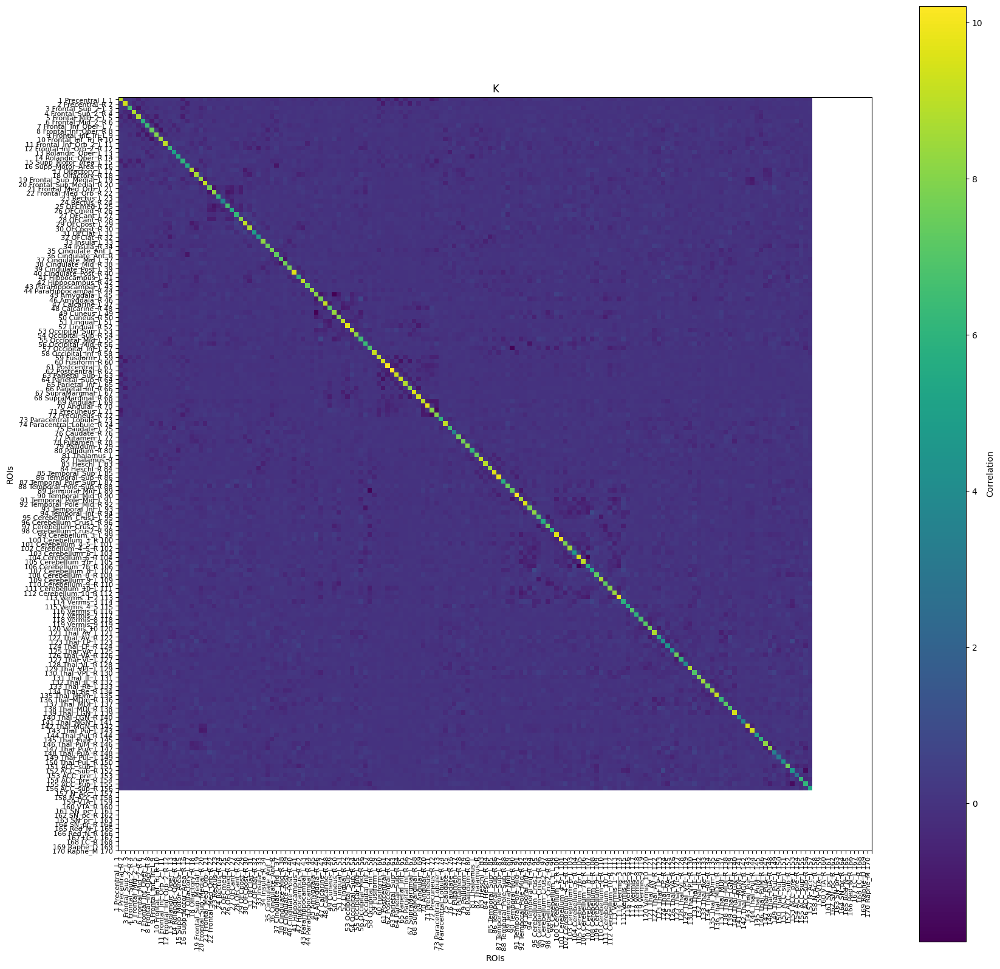

In [24]:
# Visualize K


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 20))

plt.imshow(K_, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('K')

plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [55]:
# filtering out the smaller elements

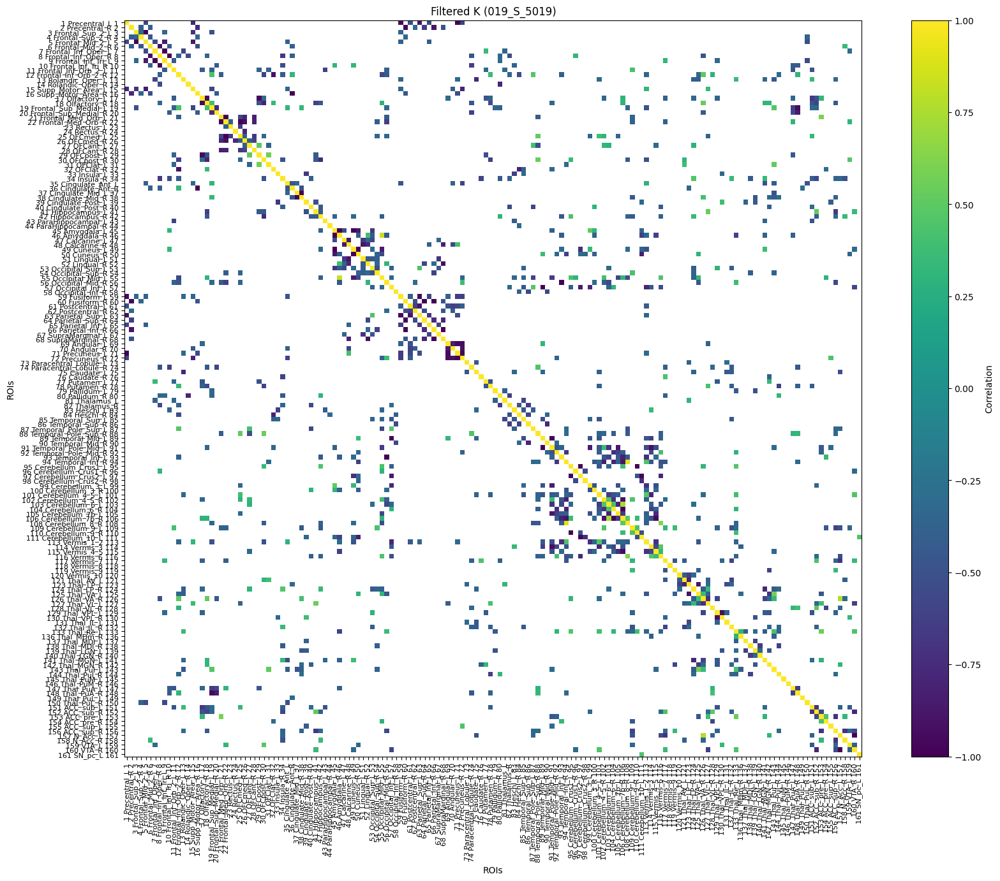

In [25]:
# Set the threshold
threshold = 0.3

#threshold = 5 # for the classic product

# Create a boolean mask for the condition
mask = np.abs(K_) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix = np.where(mask, K_, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -1, 1
plt.imshow(filtered_matrix, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K (019_S_5019)')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_AAL3_filtered_ADNI_019_S_5019.png', dpi=300)
#plt.savefig('K_AAL3_filtered_ADNI_019_S_5019_test_matrix_product1.png', dpi=300)

plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {121, 170, 133}. Label image only contains 164 labels (including background).
  warnings.warn(


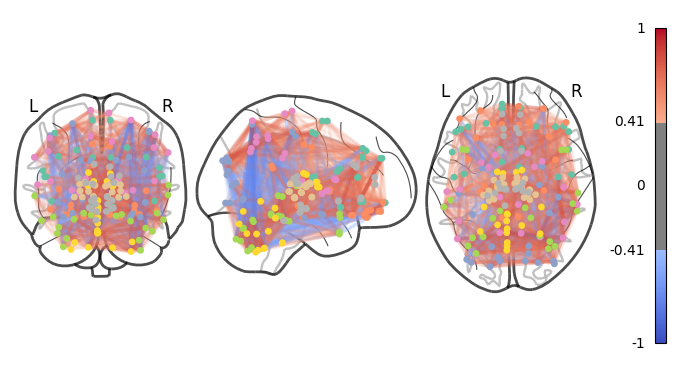

In [26]:
#

# June 3, AAL3 connectome

#



from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_bb/output.nii.gz/601_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}

# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="80%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome.png', dpi=300)
plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170}. Label image only contains 162 labels (including background).
  warnings.warn(


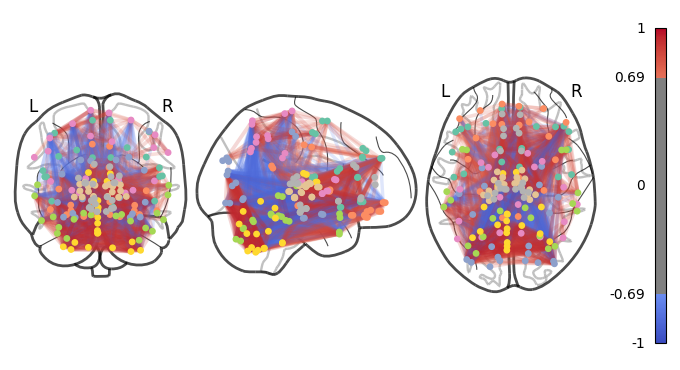

In [36]:
# follow-up

from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file_fu = "/Users/mariamannone/Desktop/new_phd_/DICOM_cc/output.nii.gz/601_resting_state_fmri.nii.gz"

aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series_fu = masker.fit_transform(nifti_file_fu)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois_fu = np.any(time_series_fu, axis=0)
non_empty_indices_fu = np.where(non_empty_rois_fu)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series_fu = time_series_fu[:, non_empty_indices_fu]

# Compute the connectivity matrix
correlation_measure_fu = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix_fu = correlation_measure.fit_transform([filtered_time_series_fu])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords_fu = np.array([coords[i] for i in non_empty_indices_fu])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}


# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix_fu,
    filtered_coords_fu,
    edge_threshold="80%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome_FU.png', dpi=300)
plt.show()


In [ ]:
# June 13, a new test, showing only the nodes (and the links between them) corresponding to the highest values of K



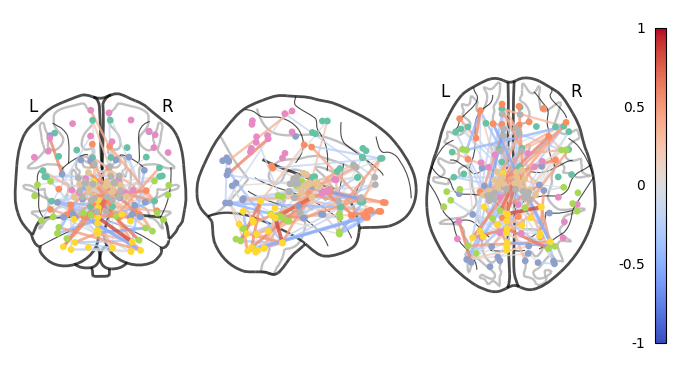

In [47]:
# identify which ROIs are above threshold in K

rois_above_threshold = np.argwhere(K_ > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(female_BL, dtype=bool) # female_BL, female_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, female_BL, 0) # not the whole one, connectivity_matrix
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.8 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_baseline_connectome_selected_patient_A.pdf')
plt.show()


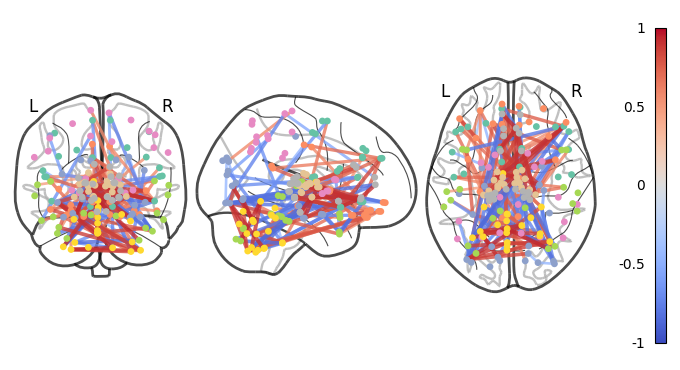

In [48]:
# identify which ROIs are above threshold in K

rois_above_threshold = np.argwhere(K_ > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(female_FU, dtype=bool) # female_BL, female_FU

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix_fu = np.where(mask_new, female_FU, 0) # not the whole one, connectivity_matrix
filtered_coords_selected = filtered_coords[list(rois_set_)]

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.8 # 0 is completely transparent, 1 is opaque
}

plotting.plot_connectome(
    selection_connectivity_matrix_fu,
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_fu_connectome_selected_patient_A.pdf')
plt.show()


In [112]:

with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]
    print("roi name :", roi_names)
    
# List of ROIs to find indices for
roi_names_selection = [
    '57 N_Acc_L 157'
]

# Get the indices for the specified ROI names
roi_indices_selection = [i for i, label in enumerate(roi_names) if label in roi_names_selection]

print("Indices for the specified ROIs:", roi_indices_selection)


roi name : ['1 Precentral_L 1', '2 Precentral_R 2', '3 Frontal_Sup_2_L 3', '4 Frontal_Sup_2_R 4', '5 Frontal_Mid_2_L 5', '6 Frontal_Mid_2_R 6', '7 Frontal_Inf_Oper_L 7', '8 Frontal_Inf_Oper_R 8', '9 Frontal_Inf_Tri_L 9', '10 Frontal_Inf_Tri_R 10', '11 Frontal_Inf_Orb_2_L 11', '12 Frontal_Inf_Orb_2_R 12', '13 Rolandic_Oper_L 13', '14 Rolandic_Oper_R 14', '15 Supp_Motor_Area_L 15', '16 Supp_Motor_Area_R 16', '17 Olfactory_L 17', '18 Olfactory_R 18', '19 Frontal_Sup_Medial_L 19', '20 Frontal_Sup_Medial_R 20', '21 Frontal_Med_Orb_L 21', '22 Frontal_Med_Orb_R 22', '23 Rectus_L 23', '24 Rectus_R 24', '25 OFCmed_L 25', '26 OFCmed_R 26', '27 OFCant_L 27', '28 OFCant_R 28', '29 OFCpost_L 29', '30 OFCpost_R 30', '31 OFClat_L 31', '32 OFClat_R 32', '33 Insula_L 33', '34 Insula_R 34', '35 Cingulate_Ant_L', '36 Cingulate_Ant_R', '37 Cingulate_Mid_L 37', '38 Cingulate_Mid_R 38', '39 Cingulate_Post_L 39', '40 Cingulate_Post_R 40', '41 Hippocampus_L 41', '42 Hippocampus_R 42', '43 ParaHippocampal_L 43

In [138]:
# Create a new matrix with only the elements >= threshold, others as NaN (optional)
filtered_matrix = np.where(mask, K_, np.nan)  # Or use another value like 0

# Get the indices of the ROIs with connections above the threshold
roi_indices = np.where(np.any(mask, axis=1))[0]

# Get the coordinates of these ROIs
atlas_coords = plotting.find_parcellation_cut_coords(labels_img=atlas_filename)
selected_coords = [atlas_coords[i] for i in roi_indices]

# Filter the connectivity matrix to include only the selected ROIs
connectivity_matrix_filtered = filtered_matrix[roi_indices, :][:, roi_indices]

# Plot the filtered connectome
edge_properties = {
    'alpha': 0.3 # 0 is completely transparent, 1 is opaque
}

# Plot the filtered connectome with the selected coordinates
plotting.plot_connectome(connectivity_matrix_filtered, selected_coords, edge_threshold=threshold, edge_kwargs=edge_properties, colorbar=True)
plt.savefig('filtered_connectome_AAL3.png', dpi=300)
plotting.show()

IndexError: index 116 is out of bounds for axis 0 with size 116

In [145]:
hippocampus_coords = atlas_coords["Hippocampus_L"]
print("Coordinates of Hippocampus_L:", hippocampus_coords)


KeyError: 'Hippocampus_L'

In [117]:
from nilearn import datasets, plotting
import numpy as np
import matplotlib.pyplot as plt

# Load the AAL3 atlas and get the ROI names and coordinates
aal3_atlas = datasets.fetch_atlas_aal()
atlas_filename = aal3_atlas.maps
roi_names = aal3_atlas.labels

# Assuming female_BL and female_FU are your connectivity matrices
# Normalize the matrices between -1 and 1
female_BL_normalized = 2 * (female_BL - np.min(female_BL)) / (np.max(female_BL) - np.min(female_BL)) - 1
female_FU_normalized = 2 * (female_FU - np.min(female_FU)) / (np.max(female_FU) - np.min(female_FU)) - 1

# Set the threshold for connectivity strength
threshold = 0.3

# Create a boolean mask for the condition
mask_BL = np.abs(female_BL_normalized) >= threshold
mask_FU = np.abs(female_FU_normalized) >= threshold

# Get the indices of the ROIs with connections above the threshold in both matrices
roi_indices_BL = np.where(np.any(mask_BL, axis=1))[0]
roi_indices_FU = np.where(np.any(mask_FU, axis=1))[0]

# Get the coordinates of these ROIs
atlas_coords = plotting.find_parcellation_cut_coords(labels_img=atlas_filename)
selected_coords_BL = [atlas_coords[i] for i in roi_indices_BL]
selected_coords_FU = [atlas_coords[i] for i in roi_indices_FU]

# Filter the connectivity matrices to include only the selected ROIs
female_BL_filtered = female_BL_normalized[roi_indices_BL, :][:, roi_indices_BL]
female_FU_filtered = female_FU_normalized[roi_indices_FU, :][:, roi_indices_FU]

# Plot the filtered connectome for female_BL
fig1 = plt.figure(figsize=(8, 6))
plotting.plot_connectome(female_BL_filtered, selected_coords_BL, edge_threshold="80%", title="Female BL Connectome")
plt.savefig('normalized_connectome_female_BL.png', dpi=300)
plt.show()

# Plot the filtered connectome for female_FU
fig2 = plt.figure(figsize=(8, 6))
plotting.plot_connectome(female_FU_filtered, selected_coords_FU, edge_threshold="80%", title="Female FU Connectome")
plt.savefig('normalized_connectome_female_FU.png', dpi=300)
plt.show()


IndexError: index 116 is out of bounds for axis 0 with size 116

In [141]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting, input_data
import nibabel as nib

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (e.g., CSV or TXT)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the labels
with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]

# Load the AAL3 atlas data
aal3_img = nib.load(aal3_atlas_filename)
atlas_data = aal3_img.get_fdata()

# Get unique ROI names (removing duplicates)
roi_names_unique = np.unique(roi_names)

# Obtain the coordinates for each ROI
atlas_coords = {}
for i, roi_name in enumerate(roi_names_unique):
    roi_indices = np.argwhere(atlas_data == (i + 1))
    roi_coords = np.mean(roi_indices, axis=0)
    atlas_coords[roi_name] = tuple(roi_coords.astype(int))

# Display the coordinates
for roi_name, coords in atlas_coords.items():
    print(f"{roi_name}: {coords}")

# Now you can proceed to use these coordinates to plot a connectome or perform further analysis


/Users/mariamannone/test2/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mariamannone/test2/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/var/folders/tc/5k6bdv0s421bnc52mnnj7p_w0000gn/T/ipykernel_13374/190863808.py:28: RuntimeWarning: invalid value encountered in cast
  atlas_coords[roi_name] = tuple(roi_coords.astype(int))


1 Precentral_L 1: (64, 59, 60)
10 Frontal_Inf_Tri_R 10: (24, 58, 61)
100 Cerebellum_3_R 100: (55, 80, 53)
101 Cerebellum_4_5_L 101: (33, 79, 54)
102 Cerebellum_4_5_R 102: (62, 79, 50)
103 Cerebellum_6_L 103: (25, 79, 50)
104 Cerebellum_6_R 104: (69, 68, 44)
105 Cerebellum_7b_L 105: (20, 69, 46)
106 Cerebellum_7b_R 106: (67, 77, 42)
107 Cerebellum_8_L 107: (19, 77, 42)
108 Cerebellum_8_R 108: (65, 78, 31)
109 Cerebellum_9_L 109: (22, 79, 32)
11 Frontal_Inf_Orb_2_L 11: (68, 58, 42)
110 Cerebellum_9_R 110: (18, 59, 42)
111 Cerebellum_10_L 111: (47, 64, 66)
112 Cerebellum_10_R 112: (40, 62, 66)
113 Vermis_1_2 113: (48, 69, 29)
114 Vermis_3 114: (39, 70, 29)
115 Vermis_4_5 115: (47, 86, 50)
116 Vermis_6 116: (40, 87, 50)
117 Vermis_7 117: (47, 89, 31)
118 Vermis_8 118: (41, 88, 31)
119 Vermis_9 119: (47, 80, 26)
12 Frontal_Inf_Orb_2_R 12: (40, 80, 26)
120 Vermis_10 120: (52, 80, 25)
121 Thal_AV_L 121: (36, 81, 25)
122 Thal_AV_R 122: (57, 86, 27)
123 Thal_LP_L 123: (30, 87, 27)
124 Thal_LP_R

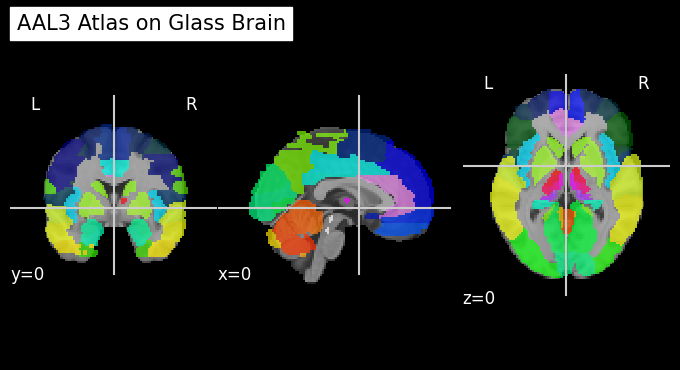

In [142]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import plotting, datasets
import nibabel as nib

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (e.g., CSV or TXT)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas data
aal3_img = nib.load(aal3_atlas_filename)

# Plot the AAL3 atlas on a glass brain
plotting.plot_roi(aal3_img, title='AAL3 Atlas on Glass Brain', display_mode='ortho', cut_coords=(0, 0, 0),
                  annotate=True, draw_cross=True, black_bg=True)

# Show the plot
plt.show()


ValueError: Shape mismatch between 'adjacency_matrix' and 'node_coords''adjacency_matrix' shape is (170, 170), 'node_coords' shape is (166, 3)

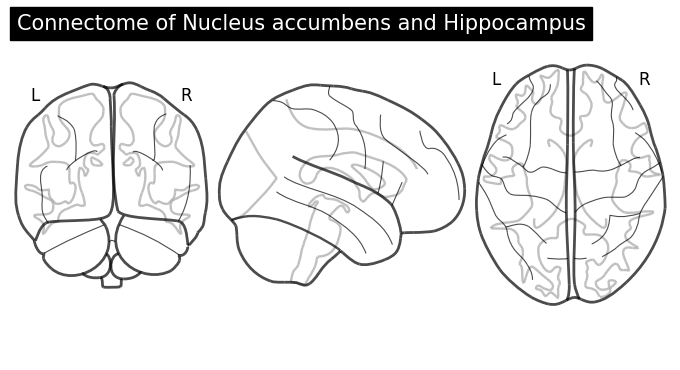

In [162]:
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (assuming it's a text file with ROI names)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'



# Load the ROI names from the labels file
with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]

# Example: Find indices for nucleus accumbens and hippocampus ROIs
roi_indices = []
for idx, name in enumerate(roi_names):
    if 'Nucleus accumbens' in name or 'Hippocampus' in name:
        roi_indices.append(idx)

# Load the AAL3 atlas image using nibabel
aal3_img = nib.load(aal3_atlas_filename)

# Example: Replace with your actual connectivity matrix (female_BL)
# For demonstration, create a random connectivity matrix
roi_count = len(roi_names)

# Plot the connectome for specific ROIs
plotting.plot_connectome(female_BL,
                         node_coords=np.array(plotting.find_parcellation_cut_coords(labels_img=aal3_atlas_filename)),
                         node_color='b', edge_threshold='99%', title='Connectome of Nucleus accumbens and Hippocampus')

plt.show()


ValueError: Shape mismatch between 'adjacency_matrix' and 'node_coords''adjacency_matrix' shape is (2, 2), 'node_coords' shape is (166, 3)

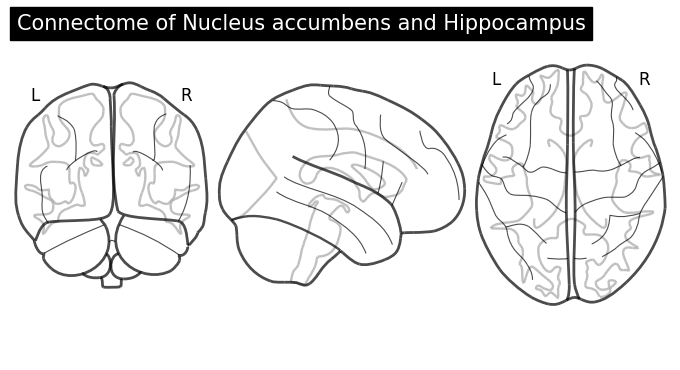

In [170]:
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting, datasets, input_data

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Load the AAL3 atlas image using nibabel
aal3_img = nib.load(aal3_atlas_filename)

# Load the AAL3 atlas and get the ROI names and coordinates
atlas_coords = plotting.find_parcellation_cut_coords(labels_img=aal3_atlas_filename)

# Example: Get indices for nucleus accumbens and hippocampus ROIs
roi_indices = []
for idx, coord in enumerate(atlas_coords):
    roi_name = roi_names[idx]  # Assuming roi_names is already defined
    if 'Nucleus accumbens' in roi_name or 'Hippocampus' in roi_name:
        roi_indices.append(idx)

# Example: Replace with your actual connectivity matrix (female_BL)
# For demonstration, create a random connectivity matrix
roi_count = len(roi_names)

# Extract the connectivity matrix for the selected ROIs
connectivity_matrix_partial = female_BL[roi_indices, :][:, roi_indices]

# Plot the connectome for specific ROIs
plotting.plot_connectome(adjacency_matrix=connectivity_matrix_partial,
                         node_coords=atlas_coords,
                         node_color='b', edge_threshold='99%', title='Connectome of Nucleus accumbens and Hippocampus')

plt.show()


In [30]:
from nilearn import datasets

# Fetch the AAL atlas
aal = datasets.fetch_atlas_aal()

# Extract the labels from the AAL atlas
atlas_labels = aal.labels

# List of ROIs to find indices for
roi_names_selection = [
    "Occipital_Mid_R", "Occipital_Inf_L", "Occipital_Inf_R", "Fusiform_L", "Postcentral_R", 
    "Supramarginal_R", "Cerebelum_Crus1_R", "Cerebelum_3_L", "Cerebelum_4_5_R", "Cerebelum_8_L",
    "Cerebelum_9_R", "Cerebelum_10_L", "Cerebelum_10_R", "Vermis_6", "Vermis_7", "Vermis_8", 
    "Cingulum_Post_R", "Frontal_Inf_Tri_R", "Precentral_R", "Frontal_Sup_L", "Heschl_L", 
    "Pallidum_L", "Parietal_Inf_L", "Occipital_Mid_L", "Hippocampus_L", "Hippocampus_R",
    "ParaHippocampal_L", "Temporal_Mid_L", "Temporal_Mid_R", "ParaHippocampal_R"
]

# Get the indices for the specified ROI names
roi_indices_selection = [i for i, label in enumerate(atlas_labels) if label in roi_names_selection]

print("Indices for the specified ROIs:", roi_indices_selection)


Indices for the specified ROIs: [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]


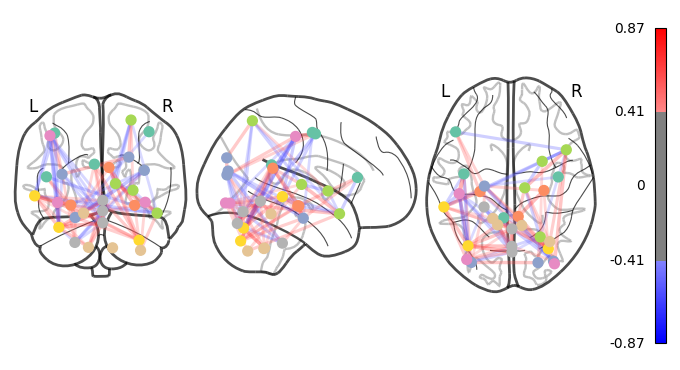

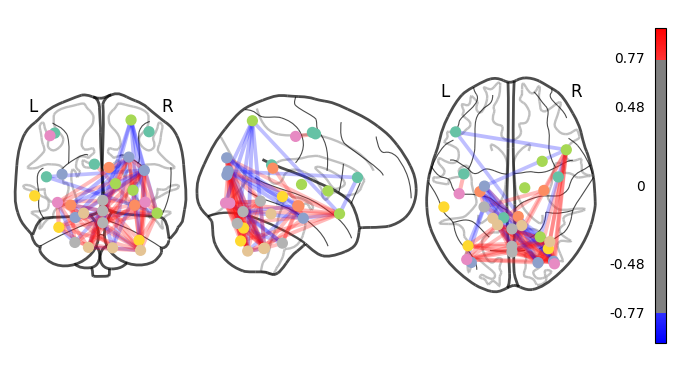

In [31]:
import numpy as np
from nilearn import datasets, plotting, input_data, connectome
import nibabel as nib

# Fetch the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Get the map and labels from the AAL atlas
atlas_filename = aal_atlas['maps']
atlas_labels = aal_atlas['labels']

# Load the NIfTI image to access coordinates
atlas_img = nib.load(atlas_filename)

# The coordinates for each ROI are obtained from the affine transformation
# and the indices where the atlas has a specific ROI value
unique_roi_values = np.unique(atlas_img.get_fdata())
roi_coords = []

# Find the center of each ROI in the atlas
for roi_value in unique_roi_values:
    if roi_value != 0:  # Skip background (value 0)
        roi_indices = np.argwhere(atlas_img.get_fdata() == roi_value)
        roi_center = np.mean(roi_indices, axis=0)  # Compute the mean position
        roi_coords.append(nib.affines.apply_affine(atlas_img.affine, roi_center))

# Now you have the coordinates for each ROI
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]

# Extract only the coordinates that correspond to your selection
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Example: Filter a connectivity matrix to these indices
# Assuming you have a connectivity matrix
# connectivity_matrix = np.random.rand(116, 116)  # Replace with your matrix
connectivity_matrix_partial = connectivity_matrix[np.ix_(roi_indices, roi_indices)]
connectivity_matrix_fu_partial = connectivity_matrix_fu[np.ix_(roi_indices, roi_indices)]

edge_properties = {
    'alpha': 0.3 # 0 is completely transparent, 1 is opaque
}

# Plot the filtered connectome with the selected coordinates
plotting.plot_connectome(connectivity_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('baseline_partial_connectome_ADNI_019_S_5019.png', dpi=300)
plotting.show()

plotting.plot_connectome(connectivity_matrix_fu_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('fu_partial_connectome_ADNI_019_S_5019.png', dpi=300)
plotting.show()


In [32]:
# As a legend for the name of each ROI:

<Figure size 10000x8000 with 0 Axes>

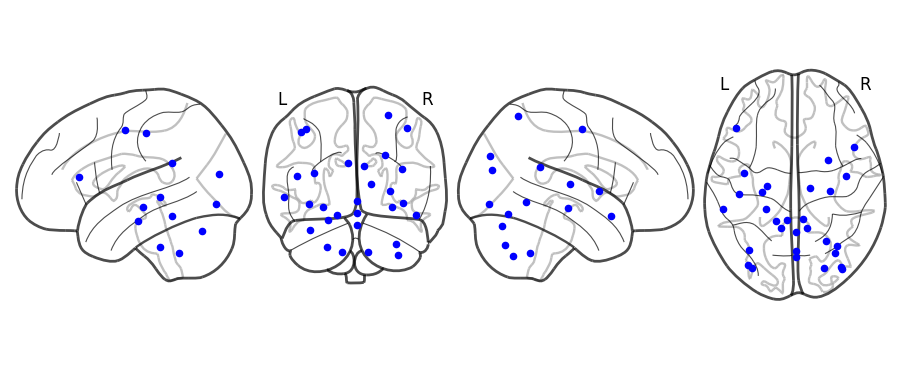

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization


In [15]:

# a brain for each region, to identify them

# to overall: add the names


<Figure size 10000x8000 with 0 Axes>

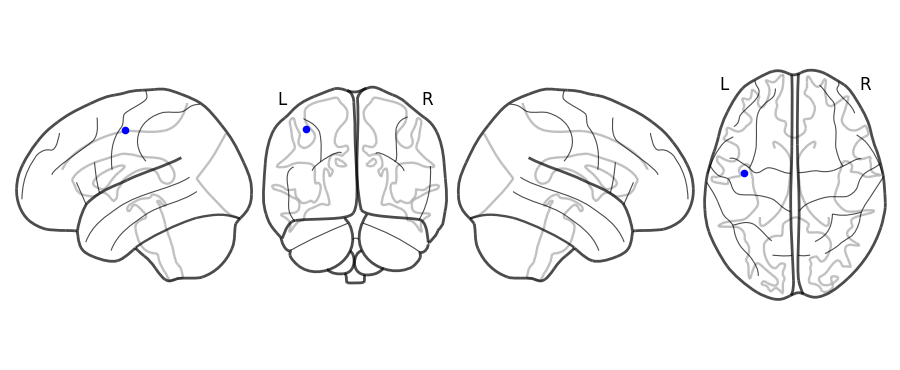

Selected ROI Names:
Precentral_L


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [1]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization

print("Selected ROI Names:")
for label in selected_labels:
    print(label)


<Figure size 10000x8000 with 0 Axes>

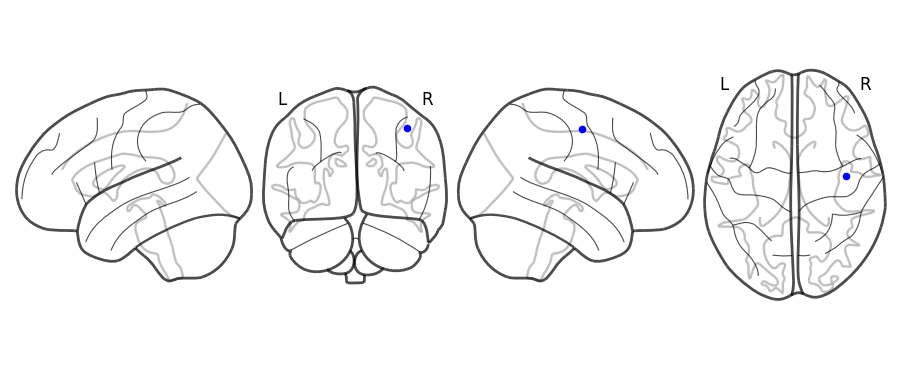

Selected ROI Names:
Precentral_R


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [2]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

In [68]:
from nilearn import datasets

# Fetch the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Get the labels (names of ROIs)
atlas_labels = aal_atlas['labels']

# Since atlas indices are 1-based, you can access the label for ROI 2
roi_name = atlas_labels[1]  # Indices in Python are 0-based, so for ROI 2, we use index 1
print("Name of ROI 2 in AAL atlas:", roi_name)

roi_name = atlas_labels[2]  # Indices in Python are 0-based, so for ROI 2, we use index 1
print("Name of ROI 2 in AAL atlas:", roi_name)
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

Name of ROI 2 in AAL atlas: Precentral_R
Name of ROI 2 in AAL atlas: Frontal_Sup_L
Selected ROI Names:
Precentral_L
Precentral_R
Frontal_Inf_Tri_L
Cingulum_Post_L
Cingulum_Post_R
Hippocampus_L
Hippocampus_R
ParaHippocampal_L
Occipital_Sup_R
Occipital_Mid_L
Occipital_Mid_R
Occipital_Inf_L
Occipital_Inf_R
Postcentral_L
Parietal_Sup_R
Putamen_R
Thalamus_R
Temporal_Pole_Sup_R
Temporal_Mid_L
Cerebelum_Crus1_L
Cerebelum_Crus2_R
Cerebelum_4_5_L
Cerebelum_7b_R
Cerebelum_9_L
Cerebelum_9_R
Cerebelum_10_L
Vermis_4_5
Vermis_6
Vermis_7
Fusiform_L
Postcentral_R
SupraMarginal_R
Cerebelum_Crus1_R
Cerebelum_3_L
Cerebelum_4_5_R
Cerebelum_8_L
Cerebelum_10_R
Parietal_Inf_L
Heschl_L
Temporal_Mid_R
ParaHippocampal_R
Vermis_8
Frontal_Sup_L
Pallidum_L
Frontal_Sup_L


<Figure size 10000x8000 with 0 Axes>

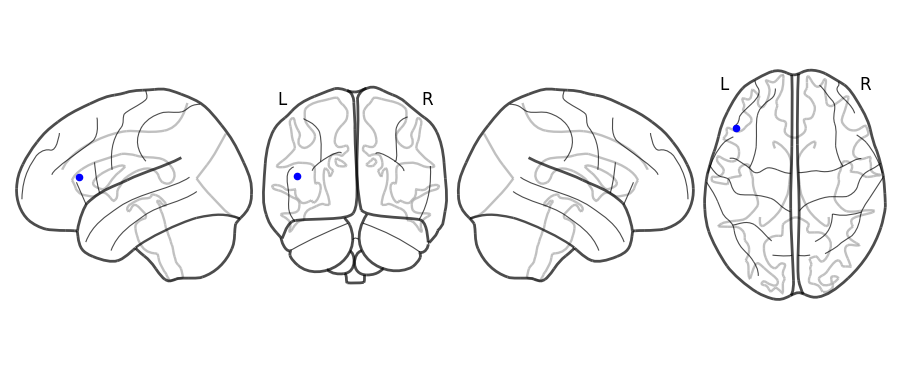

Selected ROI Names:
Frontal_Inf_Tri_L


In [69]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [13]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

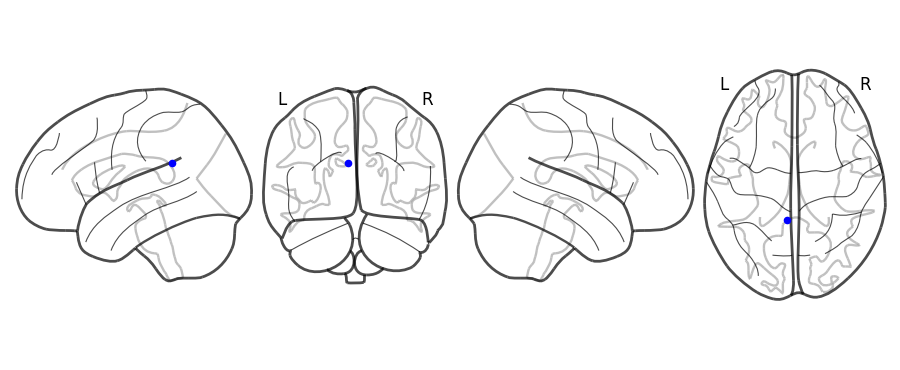

Selected ROI Names:
Cingulum_Post_L


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [35]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

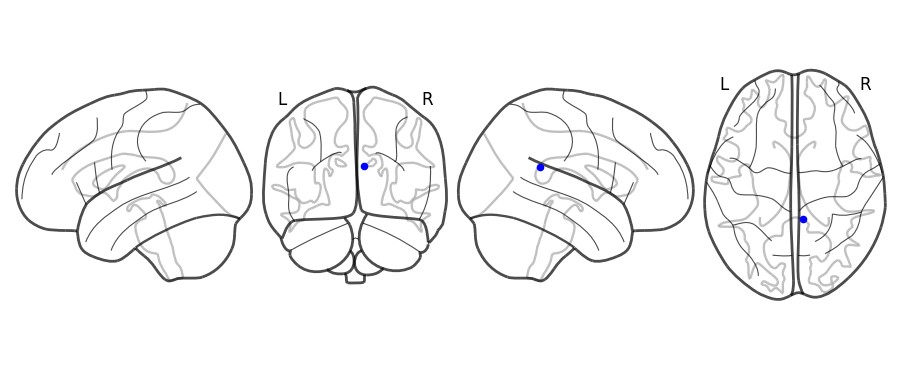

Selected ROI Names:
Cingulum_Post_R


In [23]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [36]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

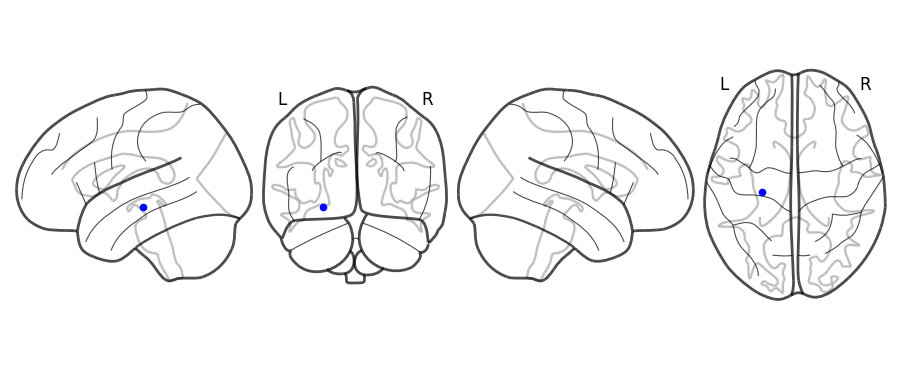

Selected ROI Names:
Hippocampus_L


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [37]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

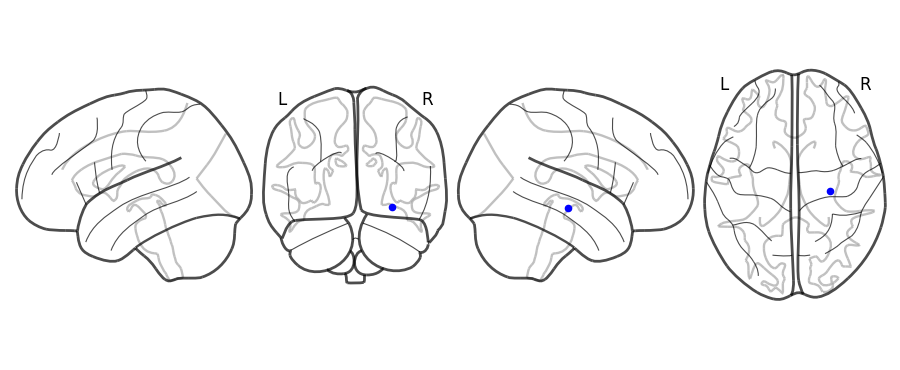

Selected ROI Names:
Hippocampus_R


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [38]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

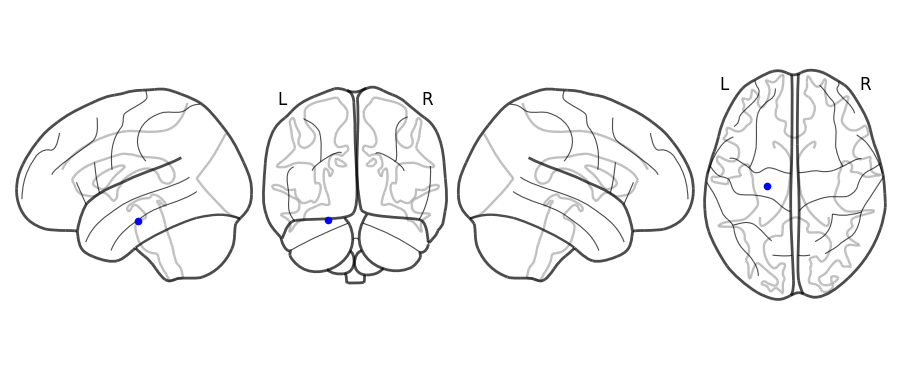

Selected ROI Names:
ParaHippocampal_L


In [26]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [39]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

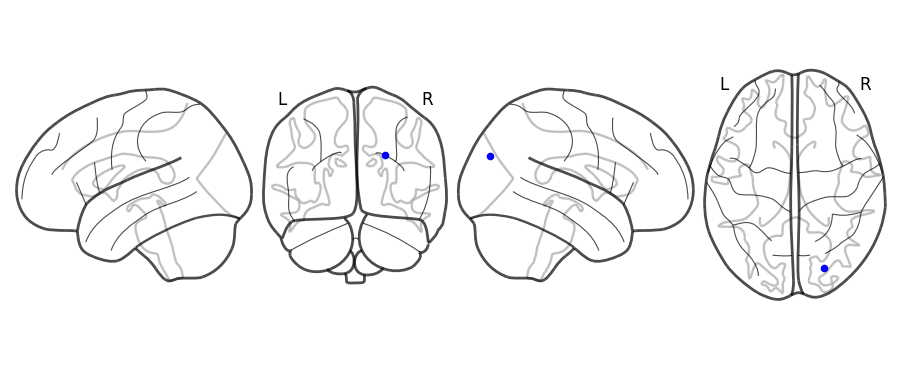

Selected ROI Names:
Occipital_Sup_R


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [50]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

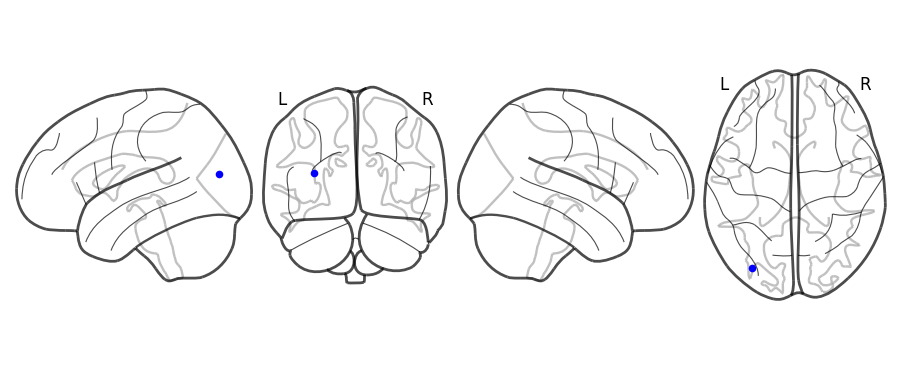

Selected ROI Names:
Occipital_Mid_L


In [28]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [51]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

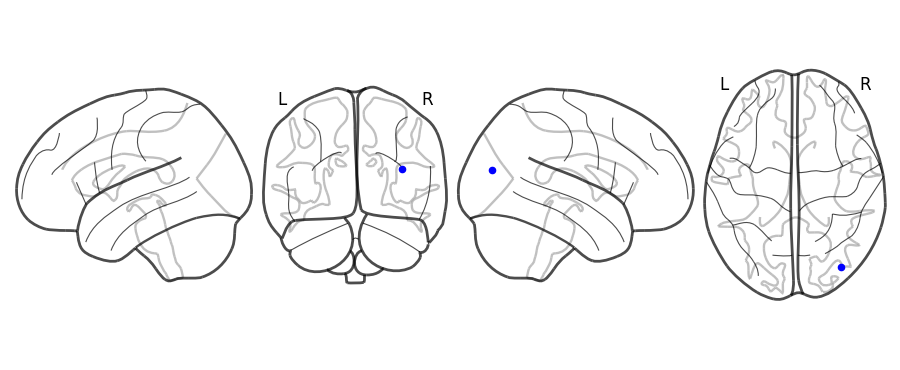

Selected ROI Names:
Occipital_Mid_R


In [29]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [52]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

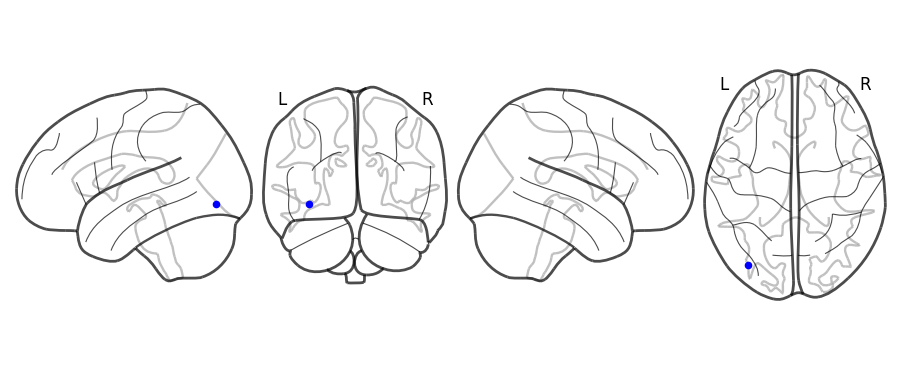

Selected ROI Names:
Occipital_Inf_L


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [53]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

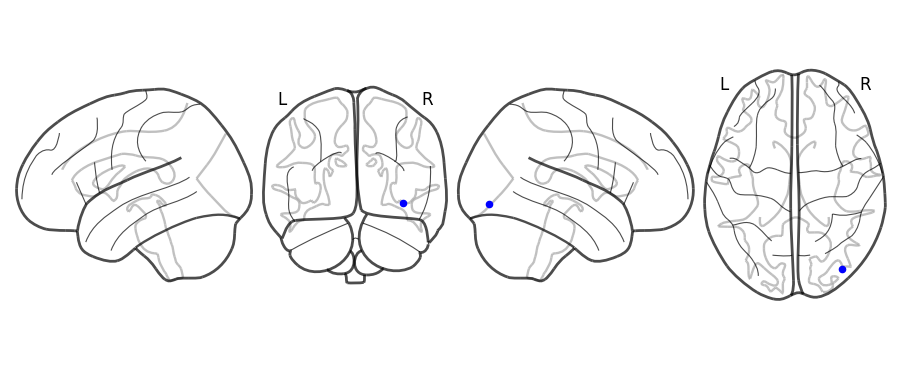

Selected ROI Names:
Occipital_Inf_R


In [31]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [54]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

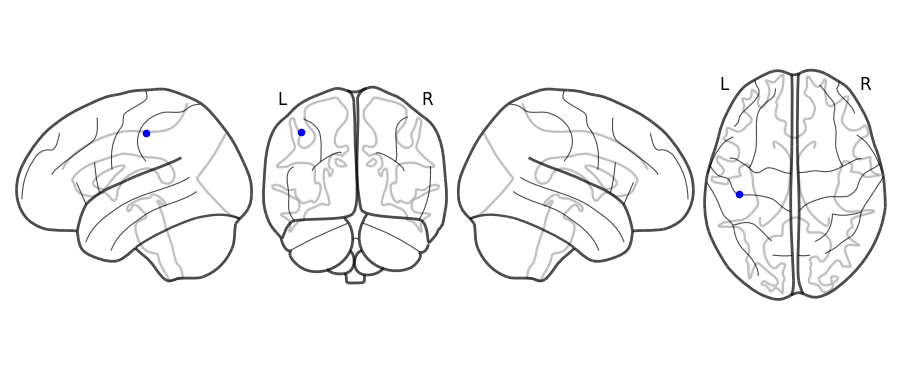

Selected ROI Names:
Postcentral_L


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [57]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

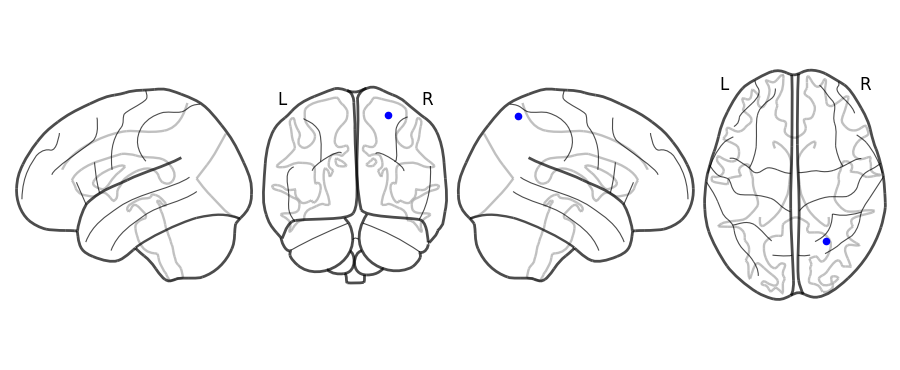

Selected ROI Names:
Parietal_Sup_R


In [33]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [60]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

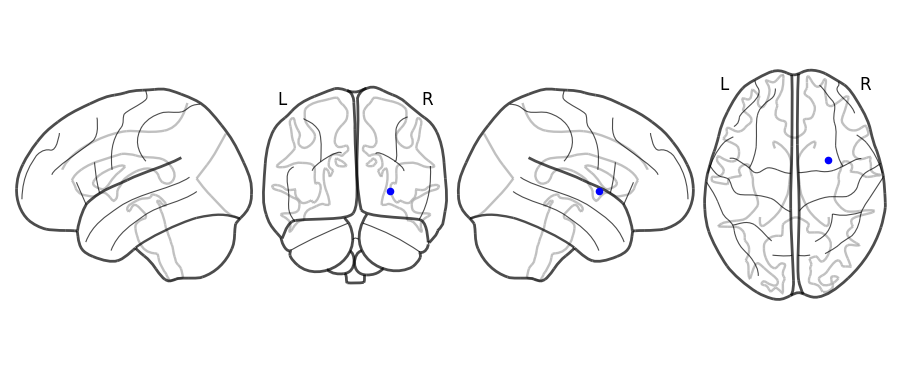

Selected ROI Names:
Putamen_R


In [34]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [74]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

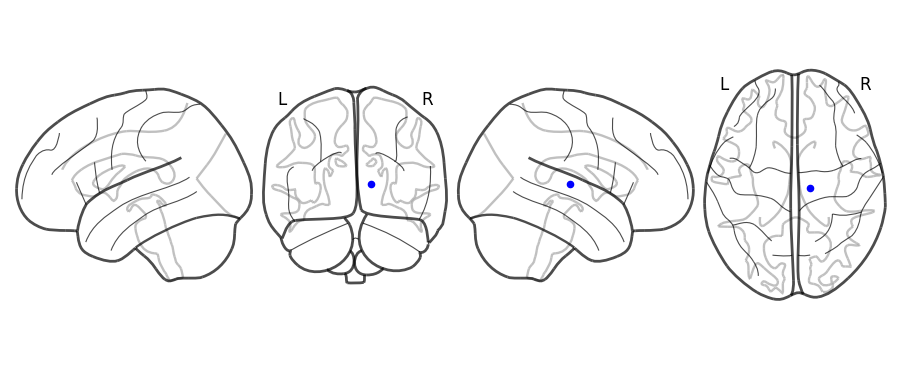

Selected ROI Names:
Thalamus_R


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [78]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

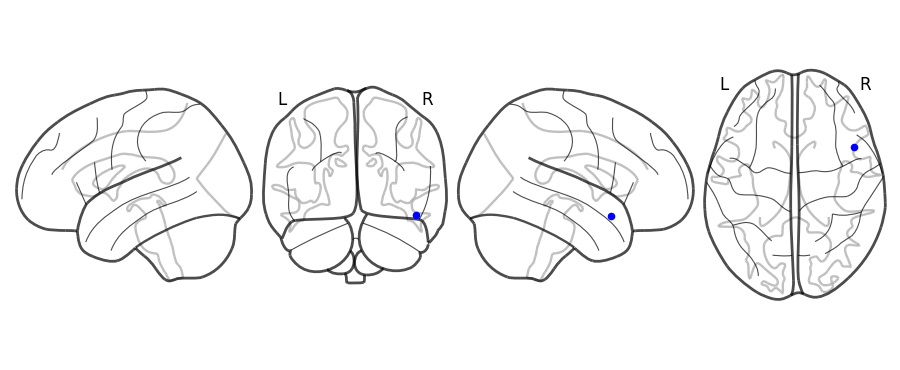

Selected ROI Names:
Temporal_Pole_Sup_R


In [36]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [84]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

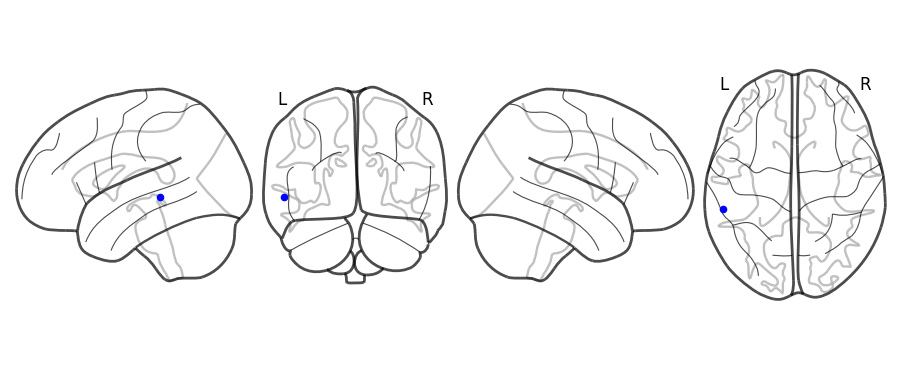

Selected ROI Names:
Temporal_Mid_L


In [37]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [85]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

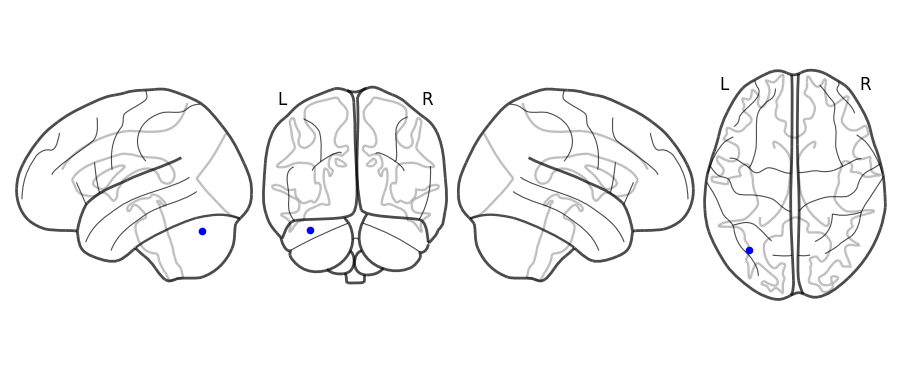

Selected ROI Names:
Cerebelum_Crus1_L


In [38]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [91]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

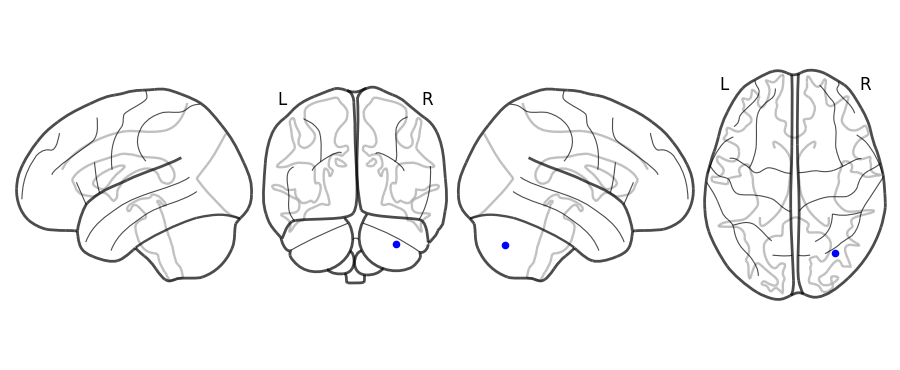

Selected ROI Names:
Cerebelum_Crus2_R


In [39]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [94]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

In [40]:
from nilearn import datasets

# Fetch the AAL atlas and extract the labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Your given 1-based indices
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]

# Convert 1-based indices to 0-based indices for Python
zero_based_indices = [i - 1 for i in roi_indices]

# Get the corresponding ROI names
roi_names = [atlas_labels[i] for i in zero_based_indices]

print("ROI names for the given indices:", roi_names)


ROI names for the given indices: ['Precentral_L', 'Precentral_R', 'Frontal_Inf_Tri_L', 'Cingulum_Post_L', 'Cingulum_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'Occipital_Sup_R', 'Occipital_Mid_L', 'Occipital_Mid_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Postcentral_L', 'Parietal_Sup_R', 'Putamen_R', 'Thalamus_R', 'Temporal_Pole_Sup_R', 'Temporal_Mid_L', 'Cerebelum_Crus1_L', 'Cerebelum_Crus2_R', 'Cerebelum_4_5_L', 'Cerebelum_7b_R', 'Cerebelum_9_L', 'Cerebelum_9_R', 'Cerebelum_10_L', 'Vermis_4_5', 'Vermis_6', 'Vermis_7']


<Figure size 10000x8000 with 0 Axes>

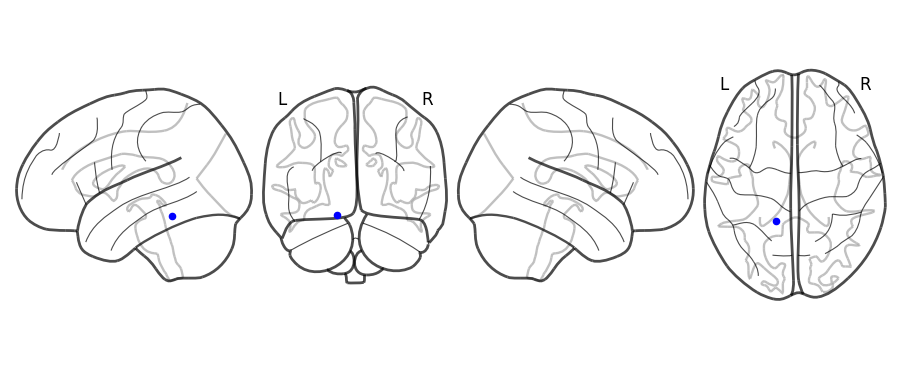

Selected ROI Names:
Cerebelum_4_5_L


In [41]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [97]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

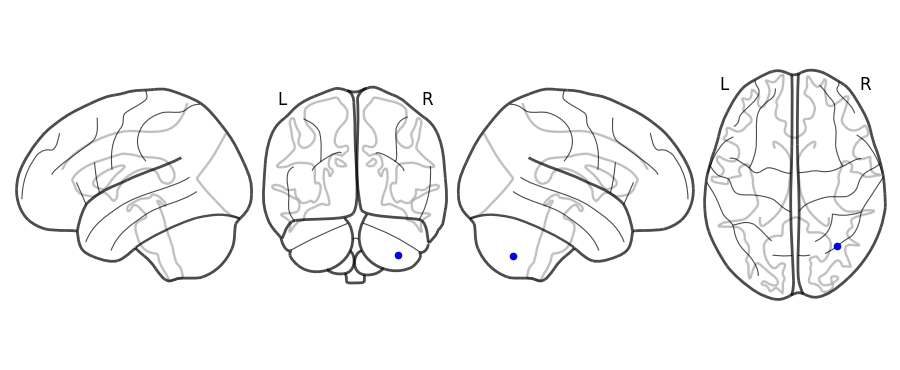

Selected ROI Names:
Cerebelum_7b_R


In [42]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [102]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

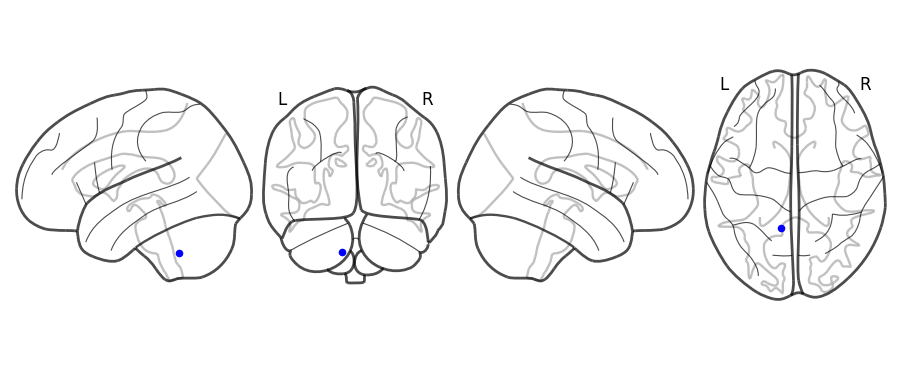

Selected ROI Names:
Cerebelum_9_L


In [43]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [105]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

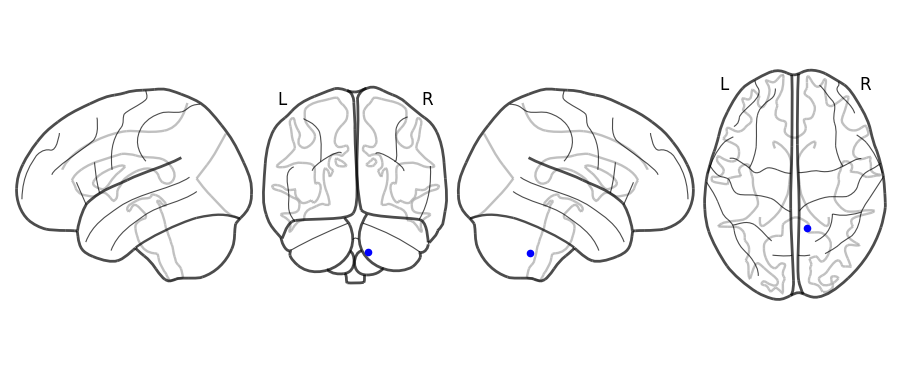

Selected ROI Names:
Cerebelum_9_R


In [44]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [106]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

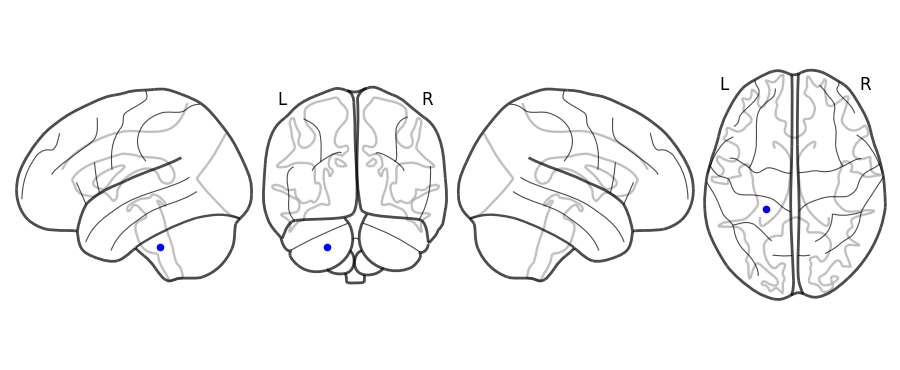

Selected ROI Names:
Cerebelum_10_L


In [45]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [107]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

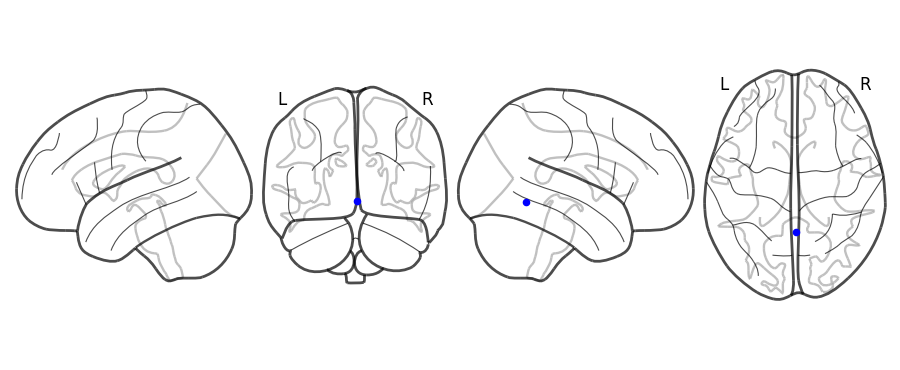

Selected ROI Names:
Vermis_4_5


In [46]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [111]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

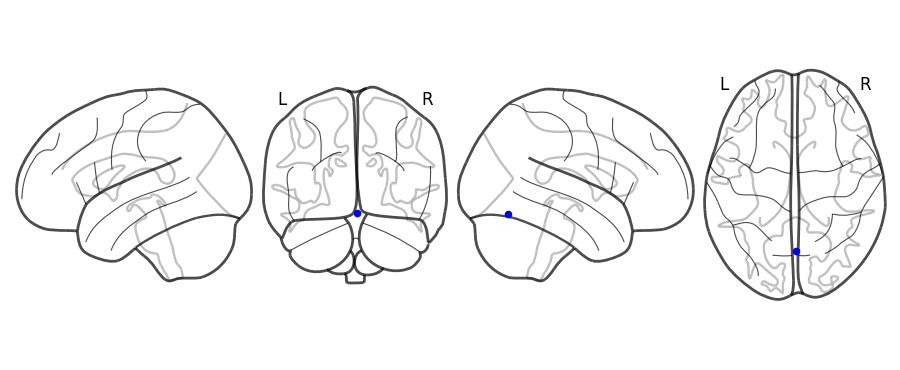

Selected ROI Names:
Vermis_6


In [47]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [112]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

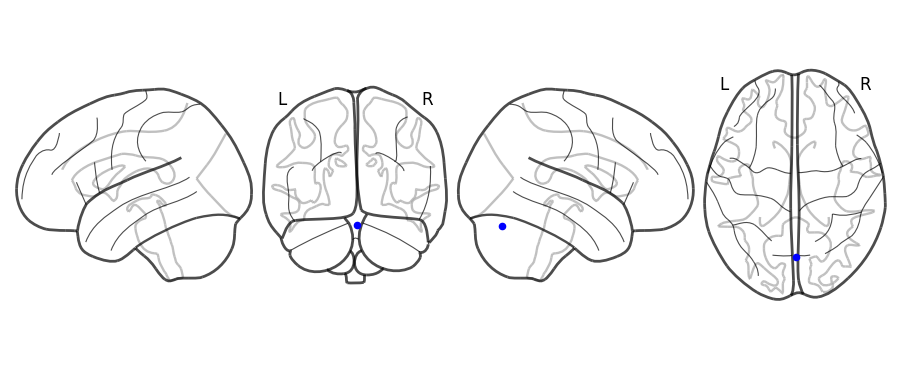

Selected ROI Names:
Vermis_7


In [48]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113]
roi_indices = [113]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

In [49]:
# First list with selected ROIs
first_list = ["Occipital_Mid_R", "Occipital_Inf_L", "Occipital_Inf_R", "Fusiform_L", "Postcentral_R", "Supramarginal_R",
    "Cerebelum_Crus1_R", "Cerebelum_3_L", "Cerebelum_4_5_R", "Cerebelum_8_L", "Cerebelum_9_R", "Cerebelum_10_L",
    "Cerebelum_10_R", "Vermis_6", "Vermis_7", "Vermis_8", "Cingulum_Post_R", "Frontal_Inf_Tri_R", "Precentral_R",
    "Frontal_Sup_L", "Heschl_L", "Pallidum_L", "Parietal_Inf_L", "Occipital_Mid_L", "Hippocampus_L", "Hippocampus_R",
    "ParaHippocampal_L", "Temporal_Mid_L", "Temporal_Mid_R", "ParaHippocampal_R"]

# Second list with different ROIs
second_list = ['Precentral_L', 'Precentral_R', 'Frontal_Inf_Tri_L', 'Cingulum_Post_L', 'Cingulum_Post_R',
               'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'Occipital_Sup_R', 'Occipital_Mid_L',
               'Occipital_Mid_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Postcentral_L', 'Parietal_Sup_R',
               'Putamen_R', 'Thalamus_R', 'Temporal_Pole_Sup_R', 'Temporal_Mid_L', 'Cerebelum_Crus1_L',
               'Cerebelum_Crus2_R', 'Cerebelum_4_5_L', 'Cerebelum_7b_R', 'Cerebelum_9_L', 'Cerebelum_9_R',
               'Cerebelum_10_L', 'Vermis_4_5', 'Vermis_6', 'Vermis_7']

# Find elements that are in the first list but not in the second list
missing_in_second = [roi for roi in first_list if roi not in second_list]

print("Elements missing in the second list:", missing_in_second)


Elements missing in the second list: ['Fusiform_L', 'Postcentral_R', 'Supramarginal_R', 'Cerebelum_Crus1_R', 'Cerebelum_3_L', 'Cerebelum_4_5_R', 'Cerebelum_8_L', 'Cerebelum_10_R', 'Vermis_8', 'Frontal_Inf_Tri_R', 'Frontal_Sup_L', 'Heschl_L', 'Pallidum_L', 'Parietal_Inf_L', 'Temporal_Mid_R', 'ParaHippocampal_R']


In [50]:
from nilearn import datasets

# Fetch the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Extract the labels (names of ROIs)
atlas_labels = aal_atlas['labels']

# Print the list of all ROI labels
for idx, label in enumerate(atlas_labels):
    print(f"{idx + 1}: {label}")


1: Precentral_L
2: Precentral_R
3: Frontal_Sup_L
4: Frontal_Sup_R
5: Frontal_Sup_Orb_L
6: Frontal_Sup_Orb_R
7: Frontal_Mid_L
8: Frontal_Mid_R
9: Frontal_Mid_Orb_L
10: Frontal_Mid_Orb_R
11: Frontal_Inf_Oper_L
12: Frontal_Inf_Oper_R
13: Frontal_Inf_Tri_L
14: Frontal_Inf_Tri_R
15: Frontal_Inf_Orb_L
16: Frontal_Inf_Orb_R
17: Rolandic_Oper_L
18: Rolandic_Oper_R
19: Supp_Motor_Area_L
20: Supp_Motor_Area_R
21: Olfactory_L
22: Olfactory_R
23: Frontal_Sup_Medial_L
24: Frontal_Sup_Medial_R
25: Frontal_Med_Orb_L
26: Frontal_Med_Orb_R
27: Rectus_L
28: Rectus_R
29: Insula_L
30: Insula_R
31: Cingulum_Ant_L
32: Cingulum_Ant_R
33: Cingulum_Mid_L
34: Cingulum_Mid_R
35: Cingulum_Post_L
36: Cingulum_Post_R
37: Hippocampus_L
38: Hippocampus_R
39: ParaHippocampal_L
40: ParaHippocampal_R
41: Amygdala_L
42: Amygdala_R
43: Calcarine_L
44: Calcarine_R
45: Cuneus_L
46: Cuneus_R
47: Lingual_L
48: Lingual_R
49: Occipital_Sup_L
50: Occipital_Sup_R
51: Occipital_Mid_L
52: Occipital_Mid_R
53: Occipital_Inf_L
54: Occ

<Figure size 10000x8000 with 0 Axes>

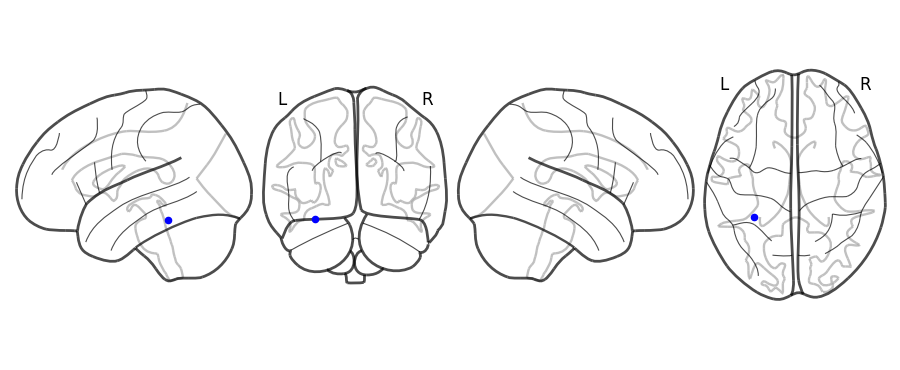

Selected ROI Names:
Fusiform_L


In [51]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]
roi_indices = [55]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

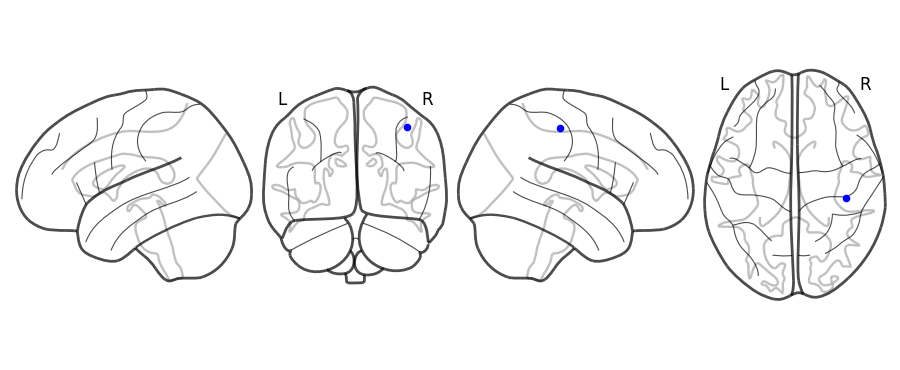

Selected ROI Names:
Postcentral_R


In [52]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]
roi_indices = [58]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

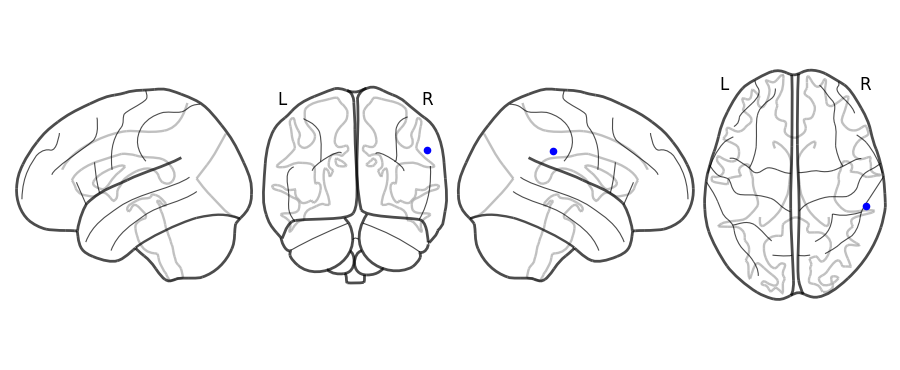

Selected ROI Names:
SupraMarginal_R


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [64]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

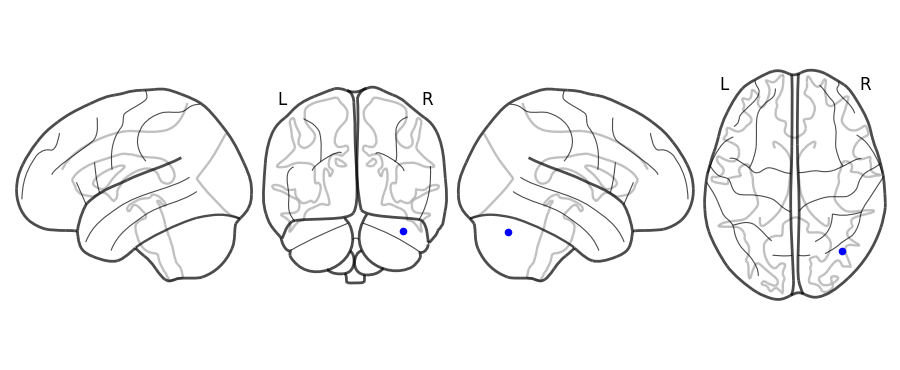

Selected ROI Names:
Cerebelum_Crus1_R


In [54]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [92]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

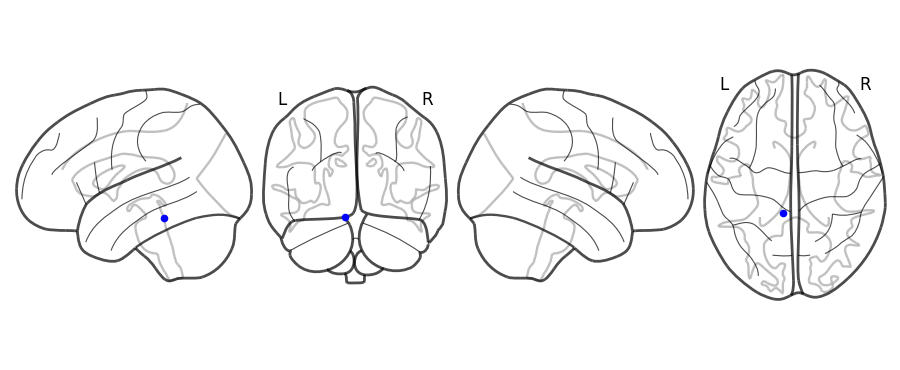

Selected ROI Names:
Cerebelum_3_L


In [55]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [95]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

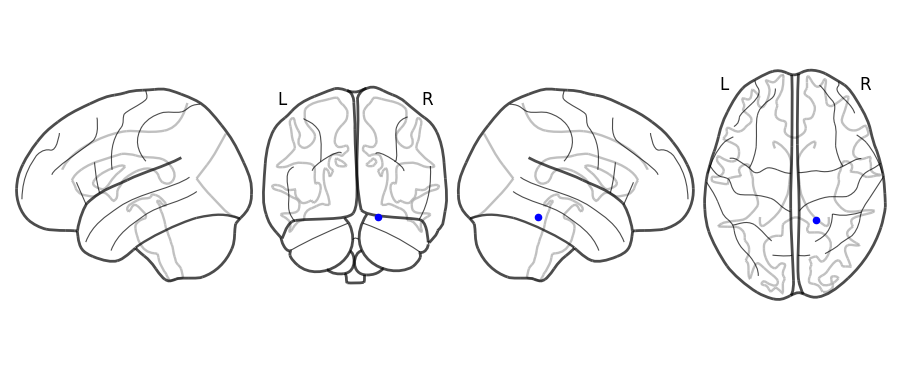

Selected ROI Names:
Cerebelum_4_5_R


In [56]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [98]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

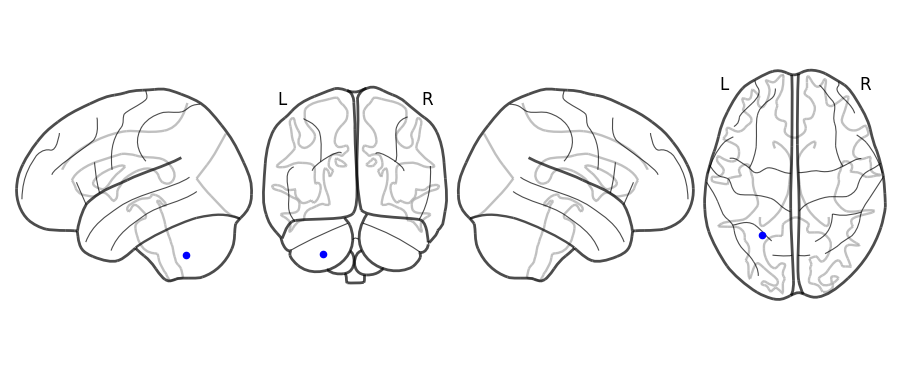

Selected ROI Names:
Cerebelum_8_L


In [57]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [103]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

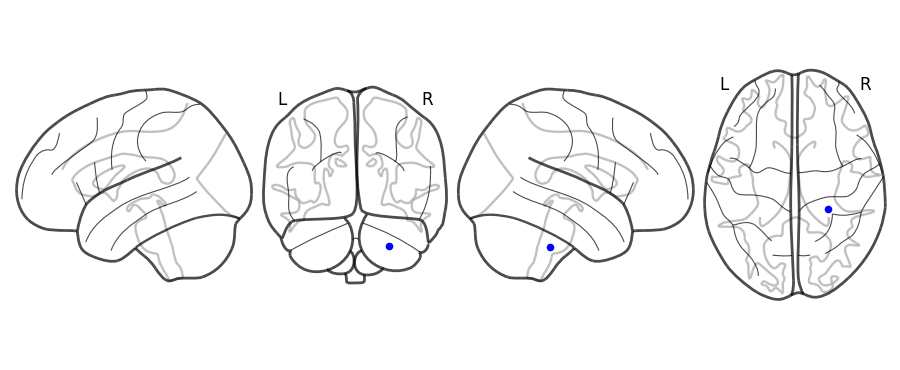

Selected ROI Names:
Cerebelum_10_R


In [58]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [108]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

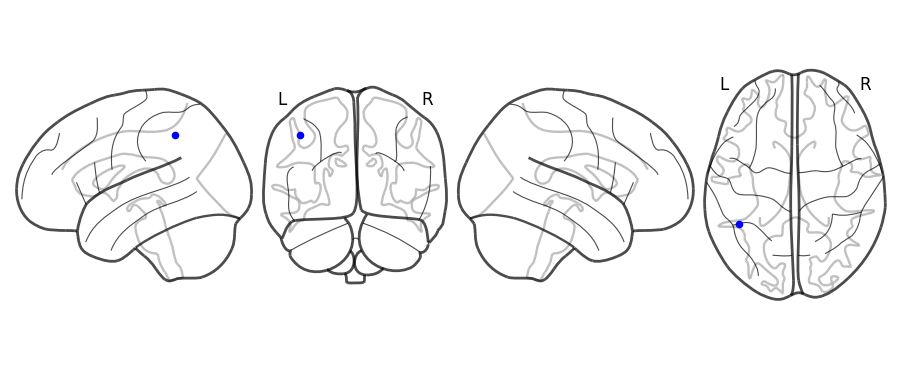

Selected ROI Names:
Parietal_Inf_L


In [59]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [61]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

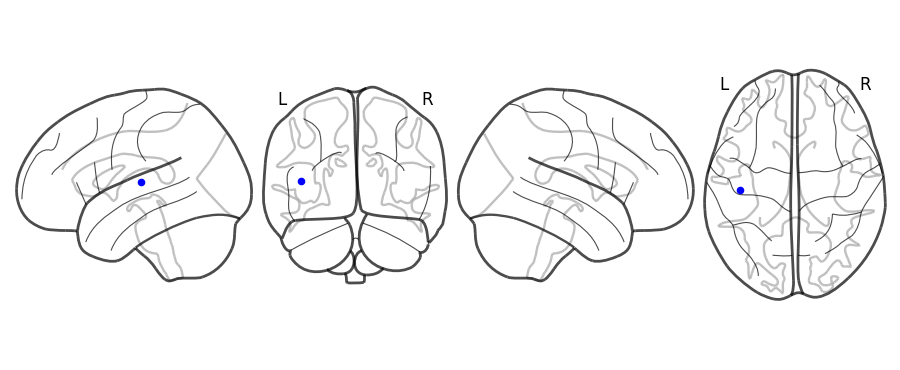

Selected ROI Names:
Heschl_L


In [60]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [79]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

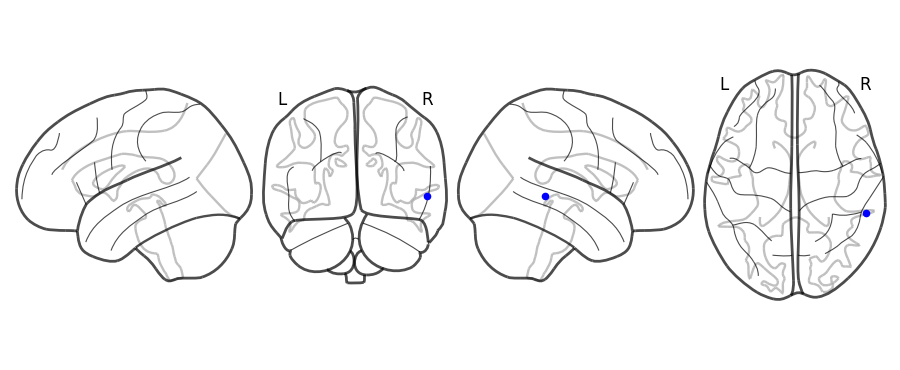

Selected ROI Names:
Temporal_Mid_R


In [61]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [86]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

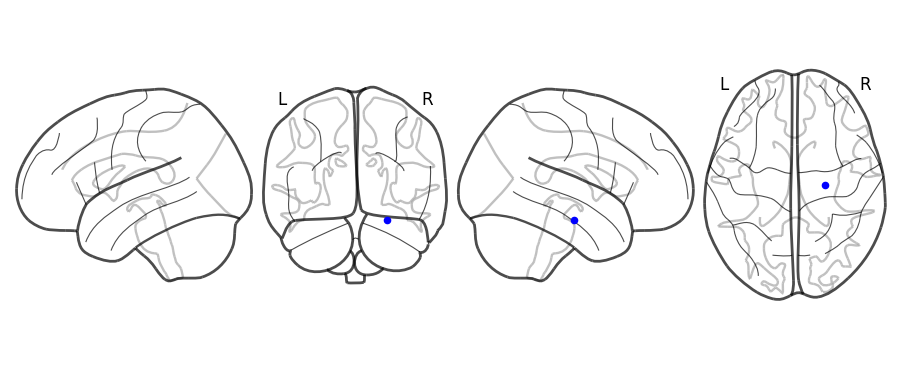

Selected ROI Names:
ParaHippocampal_R


In [62]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [40]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

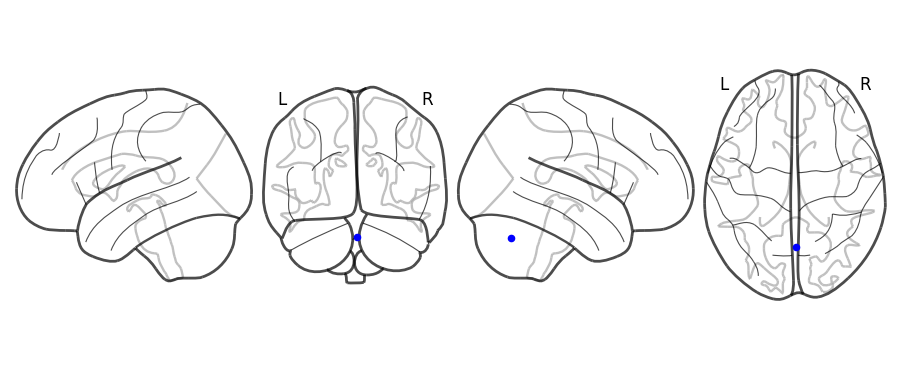

Selected ROI Names:
Vermis_8


In [63]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [114]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

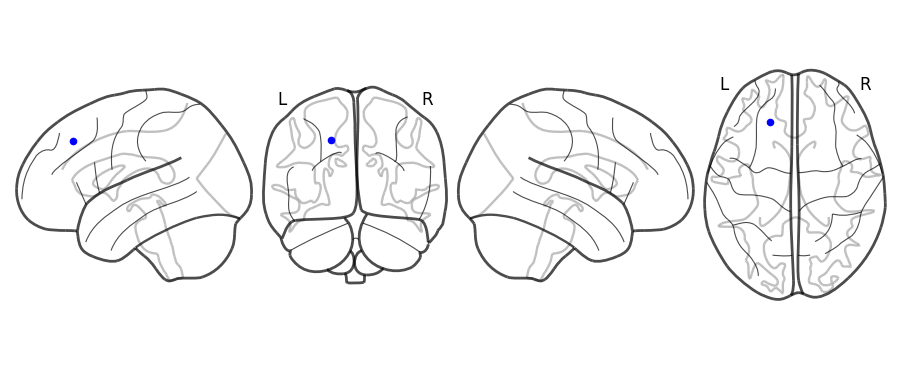

Selected ROI Names:
Frontal_Sup_L


In [64]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [3]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

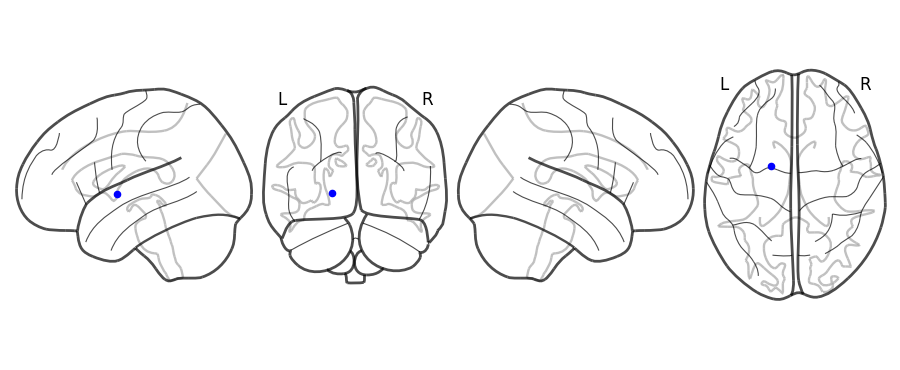

Selected ROI Names:
Pallidum_L


In [65]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [75]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

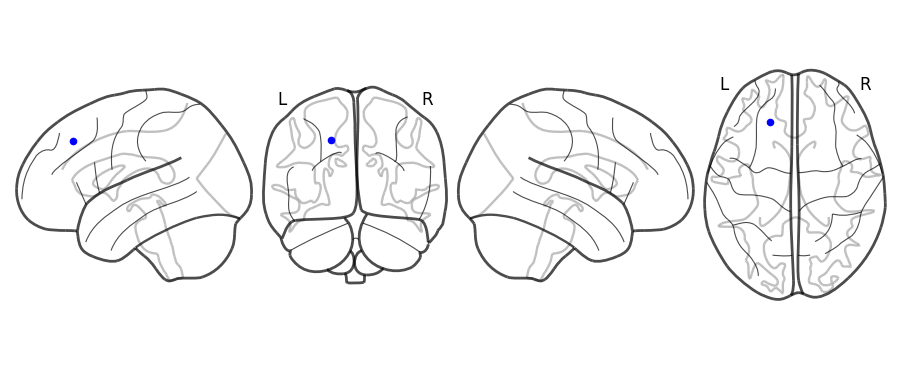

Selected ROI Names:
Frontal_Sup_L


In [66]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
# roi_indices = [55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]

roi_indices = [3]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)

<Figure size 10000x8000 with 0 Axes>

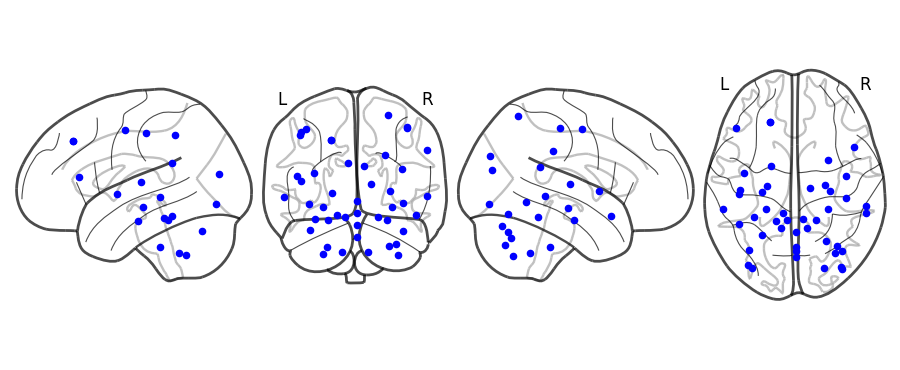

Selected ROI Names:
Precentral_L
Precentral_R
Frontal_Inf_Tri_L
Cingulum_Post_L
Cingulum_Post_R
Hippocampus_L
Hippocampus_R
ParaHippocampal_L
Occipital_Sup_R
Occipital_Mid_L
Occipital_Mid_R
Occipital_Inf_L
Occipital_Inf_R
Postcentral_L
Parietal_Sup_R
Putamen_R
Thalamus_R
Temporal_Pole_Sup_R
Temporal_Mid_L
Cerebelum_Crus1_L
Cerebelum_Crus2_R
Cerebelum_4_5_L
Cerebelum_7b_R
Cerebelum_9_L
Cerebelum_9_R
Cerebelum_10_L
Vermis_4_5
Vermis_6
Vermis_7
Fusiform_L
Postcentral_R
SupraMarginal_R
Cerebelum_Crus1_R
Cerebelum_3_L
Cerebelum_4_5_R
Cerebelum_8_L
Cerebelum_10_R
Parietal_Inf_L
Heschl_L
Temporal_Mid_R
ParaHippocampal_R
Vermis_8
Frontal_Sup_L
Pallidum_L
Frontal_Sup_L


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting

# Fetch the AAL atlas and extract coordinates and labels
aal_atlas = datasets.fetch_atlas_aal()
atlas_labels = aal_atlas['labels']

# Selected ROI indices and their corresponding labels
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113, 55, 58, 64, 92, 95, 98, 103, 108, 61, 79, 86, 40, 114, 3, 75, 3]
selected_labels = [atlas_labels[i - 1] for i in roi_indices]

# Coordinates corresponding to the specified indices (make sure `roi_coords` is correct)
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Set the figure size to a larger scale
plt.figure(figsize=(100, 80))  # Larger size for better visualization

# Use plot_glass_brain to visualize a transparent brain with markers
display = plotting.plot_glass_brain(None, display_mode='lyrz', colorbar=False, black_bg=False)

# Add markers to the specified coordinates
for coord in selected_coords:
    display.add_markers([coord], marker_color='blue', marker_size=20)

plt.show()  # Display the larger brain visualization
print("Selected ROI Names:")
for label in selected_labels:
    print(label)